# 0.0 IMPORTS

In [198]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


from plotly.subplots import make_subplots
from plotly import graph_objects as go

from IPython.core.display  import HTML
from IPython.display       import Image

from scipy.interpolate import interp1d
from scipy import stats as ss
import scikitplot as skplt


from sklearn import model_selection as ms
from sklearn import preprocessing as pp
from sklearn.preprocessing import OrdinalEncoder as oe

from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek

from sklearn    import linear_model as lm
from sklearn    import ensemble as en
from sklearn    import neighbors

import xgboost    as xgb
from lightgbm   import LGBMClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, auc, roc_auc_score, roc_curve, precision_recall_curve, classification_report
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from matplotlib import gridspec


## 0.1 Helper Functions

In [4]:
def show_percentage(ax, df):
    for p in ax.patches:
        height = p.get_height()
        # Adicionar rótulo de porcentagem somente se a altura da barra for maior que 0
        if height > 0:
            ax.text(p.get_x() + p.get_width() / 2., 
                    height + 0.05, 
                    '{:.2f}%'.format(height * 100 / len(df)), 
                    ha="center")


def jupyter_settings():
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [12, 6]
    plt.rcParams['font.size'] = 24
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None

    sns.set()

def precision_at_k(data, k = 1000):
    data = data.reset_index(drop=True)

    data['ranking'] = data.index +1

    data['precision_at_k'] = data['Exited'].cumsum() / data['ranking']

    return data.loc[k, 'precision_at_k']


def recall_at_k(data, k = 1000):
    data = data.reset_index(drop=True)

    data['ranking'] = data.index +1

    data['recall_at_k'] = data['Exited'].cumsum() / data['Exited'].sum()

    return data.loc[k, 'recall_at_k']



def precision_recall_at_k(model_name, x_val, y_val, y_prob, top_k = 1000):
    df8 = x_val.copy()
    df8['Exited'] = y_val.copy()

    df8['score'] = y_prob[:,1].tolist()

    # Sort by propensity score
    df8 = df8.sort_values(by='score', ascending=False).reset_index(drop=True)

    # Precision at k
    precision_at_x = round(precision_at_k(data = df8, k = top_k),4)
    recall_at_x = round(recall_at_k(data = df8, k = top_k),4)


    return pd.DataFrame({'Model Name': model_name,
                         'Precision at k': precision_at_x,
                         'Recall at k': recall_at_x}, index=[0])




def cross_validation (model_name, model, x_train, x_val,y_train,y_val, n_splits, top_k = 1000, verbose=False):
    
    if verbose:
        # the lenght_msg is to print only once a specific message
        length_msg = True
        i = 1
    
    # the seed usage provides repeatability 
    np.random.seed(42)
    
    # it is necessary to join the train and validation datasets
    x = pd.concat([x_train,x_val])
    y = pd.concat([y_train,y_val])
    
    
    # definition of the cross-validation strategy
    cv = ms.StratifiedKFold(n_splits = n_splits , random_state= 42, shuffle = True)
    
    precision_at_x = []
    recall_at_x = []
    
    for train_index, val_index in cv.split(x, y):      
        x_train_n , x_val_n = x.iloc[train_index], x.iloc[val_index]
        y_train_n, y_val_n = y.iloc[train_index], y.iloc[val_index]
        
        if (verbose == True) and (length_msg == True):
            print(f'training_lenght:{x_train_n.shape[0]}\nvalidation_lenght:{x_val_n.shape[0]}\n\n')
            length_msg = False
        
        if verbose:
            print(f'Iteration number:{i}')
            i += 1

        # fit and predict_proba
        model.fit(x_train_n, y_train_n)
        yhat_proba = model.predict_proba(x_val_n)

        df_aux = x_val_n.copy()
        df_aux['Exited'] = y_val_n.values
        df_aux['score'] = yhat_proba[:,1].tolist()

        # Sort by propensity score
        df_aux = df_aux.sort_values(by='score', ascending=False).reset_index(drop=True)       
    

        # save the metrics value to the list
        precision_at_x.append(precision_at_k(data = df_aux, k = top_k))
        recall_at_x.append(recall_at_k(data = df_aux, k = top_k))
        

    return pd.DataFrame({ 'Model Name': model_name,
                          'Precision': round(np.mean(precision_at_x), 3).astype(str) + '+/-' + round(np.std(precision_at_x),2).astype(str),
                          'Recall': round(np.mean(recall_at_x), 3).astype(str) + '+/-' + round(np.std(recall_at_x),2).astype(str)}, 
                          index=[0])



def evaluate_classification_model(model_name, y_test, y_pred):
    # Calcular as métricas
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    # Criar um DataFrame com as métricas
    metrics = {
        'Model':[model_name],
        'Precision': [precision],
        'Recall': [recall],
        'Accuracy': [accuracy],
        'F1 Score': [f1]
    }
    metrics_df = pd.DataFrame(metrics)
    
    return metrics_df

def plot_confusion_matrix(cm, class_names):
    # Criar um DataFrame para a matriz de confusão
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
    
    # Plotar a matriz de confusão
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
    plt.ylabel('Verdadeiro')
    plt.xlabel('Previsto')
    plt.title('Matriz de Confusão')
    plt.show()

def ranking_score(x_val, y_val, y_hat):
        df_aux = x_val.copy()
        df_aux['response'] = y_val.values
        df_aux['pred'] = (y_prob[:, 1] >= 0.5).astype(int)
        df_aux['score'] = y_hat[:,1].tolist()

        # Sort by propensity score
        df_aux = df_aux.sort_values(by='score', ascending=False).reset_index(drop=True)  
        df_aux_inteiro = df_aux.sort_values(by='score', ascending=False).reset_index(drop=True)       
    
        df_aux['ranking'] = df_aux.index +1
        df_aux['recall_at_k'] = df_aux['response'].cumsum() / df_aux['response'].sum()
        df_aux['precision_at_k'] = df_aux['response'].cumsum() / df_aux['ranking']
    
        percents = np.arange(0.05, 1.05, 0.05)
        k_list = []

        for i in percents:
            k = int(len(df_aux)*i) - 1
            k_list.append( k )

        df_aux = df_aux.loc[k_list, ['score', 'precision_at_k', 'recall_at_k']]
        df_aux['k'] = percents
        df_aux = df_aux[['k', 'precision_at_k', 'recall_at_k', 'score']]
        df_aux = df_aux.reset_index(drop=True)

        return df_aux_inteiro, df_aux

def cramer_v( x, y):
    #confusion matrix
    cm = pd.crosstab(x, y).values
    
    #sum of observations
    n = cm.sum()
    
    #number of lines and columns
    r, k = cm.shape
    
    #chi²
    chi2 = ss.chi2_contingency( cm )[0]
    
    #bias correction
    chi2corr = max(0, chi2 - (k - 1) * (r - 1) / (n - 1))
    kcorr = k - (k-1)**2 / (n - 1)
    rcorr = r - (r-1)**2 / (n - 1)

    return np.sqrt( (chi2corr / n) / (min(kcorr -1, rcorr - 1)))

In [5]:
jupyter_settings()

## 0.2 Loading Dataset

In [6]:
data_raw = pd.read_csv('./datasets/churn.csv')

In [7]:
data_raw.head(5)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [8]:
X = data_raw.drop(['RowNumber', 'CustomerId', 'Exited', 'Surname'], axis=1)
y = data_raw['Exited']

x_train, x_test, y_train, y_test = ms.train_test_split(X, y, test_size=0.2, random_state=42)

## 1.0 DATA DESCRIPTION

In [9]:
data_raw.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


### 1.1. Rename Columns

There's no need to change anything about the columns, they're all correct.

In [10]:
data_raw.columns.tolist()

['RowNumber',
 'CustomerId',
 'Surname',
 'CreditScore',
 'Geography',
 'Gender',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'HasCrCard',
 'IsActiveMember',
 'EstimatedSalary',
 'Exited']

### 1.2. Data Dimensions

In [11]:
print(f'Number of rows: {data_raw.shape[0]}')
print(f'Number of cols: {data_raw.shape[1]}')

Number of rows: 10000
Number of cols: 14


### 1.3. Data Types

In [12]:
data_raw.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

### 1.4. Check NA

In [13]:
data_raw.isnull().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [14]:
data_raw.duplicated().sum()

0

### 1.5. Fill NA

We have no empty data, no need to fill anything

### 1.6. Change Types

In [15]:
data_raw['HasCrCard'] = data_raw['HasCrCard'].astype('int64')

x_train['HasCrCard'] = x_train['HasCrCard'].astype('int64')
x_test['HasCrCard'] = x_test['HasCrCard'].astype('int64')

### 1.7. Columns Description

### 1.8. Data Statistical

In [16]:
num_attributes = data_raw.select_dtypes(include=['int64', 'float64'])
cat_attributes = data_raw.select_dtypes(include=['object'])

#### 1.8.1 Numerical Attributes

In [17]:
min_ =  pd.DataFrame(num_attributes.apply(np.min)).T
max_ =  pd.DataFrame(num_attributes.apply(np.max)).T

mean_ =  pd.DataFrame(num_attributes.apply(np.mean)).T
median_ =  pd.DataFrame(num_attributes.apply(np.median)).T

std_ =  pd.DataFrame(num_attributes.apply(np.std)).T
range_ =  pd.DataFrame(num_attributes.apply(lambda x: x.max() - x.min())).T
skew_ =  pd.DataFrame(num_attributes.apply(lambda x: x.skew())).T
kurtosis_ =  pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis())).T


data_describe =pd.concat([min_, max_, mean_, median_, std_, range_, skew_, kurtosis_]).T.reset_index()
data_describe.columns = ['attributes', 'min', 'max', 'mean', 'median', 'std', 'range', 'skew', 'kurtosis']

data_describe.round(2)

,attributes,min,max,mean,median,std,range,skew,kurtosis
0,RowNumber,1.00,10000.00,5000.50,5000.50,2886.75,9999.00,0.00,-1.20
1,CustomerId,15565701.00,15815690.00,15690940.57,15690738.00,71932.59,249989.00,0.00,-1.20
2,CreditScore,350.00,850.00,650.53,652.00,96.65,500.00,-0.07,-0.43
3,Age,18.00,92.00,38.92,37.00,10.49,74.00,1.01,1.40
4,Tenure,0.00,10.00,5.01,5.00,2.89,10.00,0.01,-1.17
5,Balance,0.00,250898.09,76485.89,97198.54,62394.29,250898.09,-0.14,-1.49
6,NumOfProducts,1.00,4.00,1.53,1.00,0.58,3.00,0.75,0.58
7,HasCrCard,0.00,1.00,0.71,1.00,0.46,1.00,-0.90,-1.19
8,IsActiveMember,0.00,1.00,0.52,1.00,0.50,1.00,-0.06,-2.00
9,EstimatedSalary,11.58,199992.48,100090.24,100193.92,57507.62,199980.90,0.00,-1.18


#### 1.8.2. Categorical Attributes

In [18]:
# number of unique categories in each object columns
cat_attributes.apply(lambda x: x.unique().shape[0])

Surname      2932
Geography       3
Gender          2
dtype: int64

In [19]:
for i in cat_attributes.columns:
    print(f'{i}: {cat_attributes[i].unique()}')

Surname: ['Hargrave' 'Hill' 'Onio' ... 'Kashiwagi' 'Aldridge' 'Burbidge']
Geography: ['France' 'Spain' 'Germany']
Gender: ['Female' 'Male']


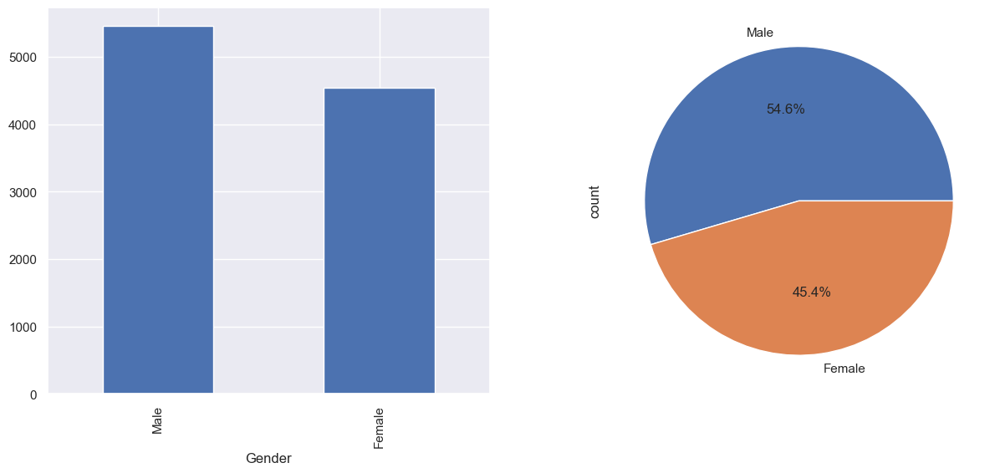

In [20]:
# Gender
# I have 9% more male customers than female

plt.subplot(1, 2, 1)
cat_attributes['Gender'].value_counts().plot(kind='bar', figsize=(15, 6))
plt.subplot(1, 2, 2)
cat_attributes['Gender'].value_counts().plot(kind='pie', autopct='%1.1f%%', figsize=(15, 6));


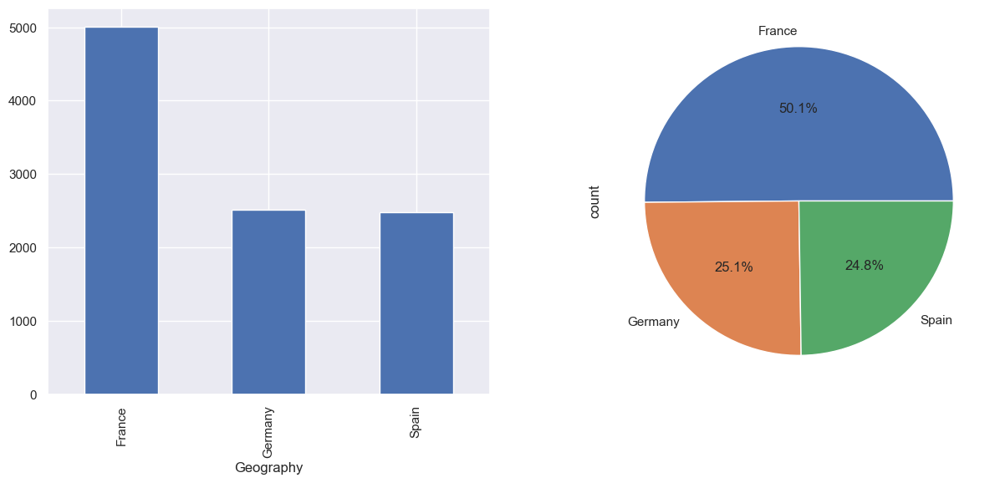

In [21]:

# Geography
# I have 50% of customers from France
plt.subplot(1, 2, 1)
cat_attributes['Geography'].value_counts().plot(kind='bar', figsize=(15, 6))
plt.subplot(1, 2, 2)
cat_attributes['Geography'].value_counts().plot(kind='pie', autopct='%1.1f%%', figsize=(15, 6));

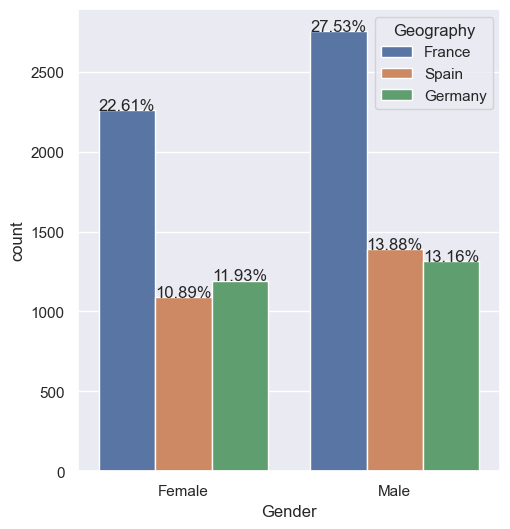

In [22]:
plt.subplot(1, 2, 1)
sns.countplot(x='Gender', hue='Geography', data=cat_attributes)
show_percentage(df=cat_attributes, ax=plt.gca())


## 2.0. FEATURE ENGINEERING

In [23]:
data_raw.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


### 2.1.1 Training Dataset

In [24]:
x_train['Gender'] = x_train['Gender'].map({'Female': 0, 'Male': 1})

x_train['CreditScoreCategory'] = x_train['CreditScore'].apply(lambda x: 'Bad' if x <= 400 else 'Medium' if x >= 401 and x <= 719 else 'Good' if x >= 720 else 'Very good')

x_train['AgeGroup'] = pd.cut(x_train['Age'], bins=[0, 35, 60, 75, 100], labels=['Young', 'Middle-aged', 'Senior', 'Very Senior'])

x_train['IsSeniorCitizen'] = x_train['Age'].apply(lambda x: 1 if x >= 60 else 0)

x_train['BalanceSalaryRatio'] = x_train['Balance'] / x_train['EstimatedSalary']

x_train['AgeBalanceInteraction'] =   x_train['Balance'] / x_train['Age']

### 2.1.1 Test Dataset

In [25]:
x_test['Gender'] = x_test['Gender'].map({'Female': 0, 'Male': 1})

x_test['CreditScoreCategory'] = x_test['CreditScore'].apply(lambda x: 'Bad' if x <= 400 else 'Medium' if x >= 401 and x <= 719 else 'Good' if x >= 720 else 'Very good')

x_test['AgeGroup'] = pd.cut(x_test['Age'], bins=[0, 35, 60, 75, 100], labels=['Young', 'Middle-aged', 'Senior', 'Very Senior'])

x_test['IsSeniorCitizen'] = x_test['Age'].apply(lambda x: 1 if x >= 60 else 0)

x_test['BalanceSalaryRatio'] = x_test['Balance'] / x_test['EstimatedSalary']

x_test['AgeBalanceInteraction'] =  x_test['Balance'] / x_test['Age'] 

## 3.0. DATA FILTERING

In [26]:
df3 = pd.concat([x_train, y_train], axis = 1)

## 4.0. EDA

In [27]:
df4 = df3.copy()

### 4.1 Análise Univáriada

Como podemos constatar através do gráfico, temos uma variável resposta desbalanceda.

#### 4.1.1 Target

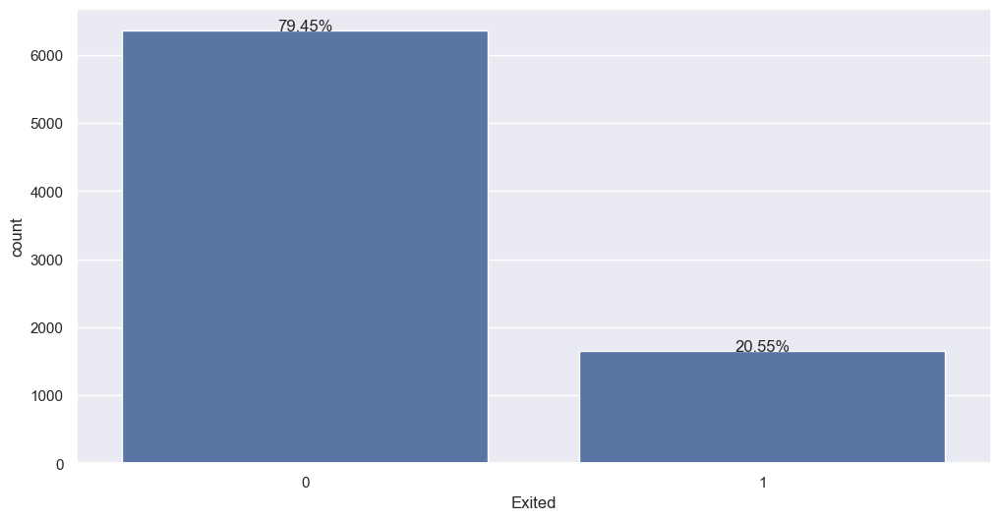

In [28]:
ax = sns.countplot(data=df4, x='Exited')
show_percentage(ax, df4)


#### 4.1.2 Gender

Womans exited more than mans


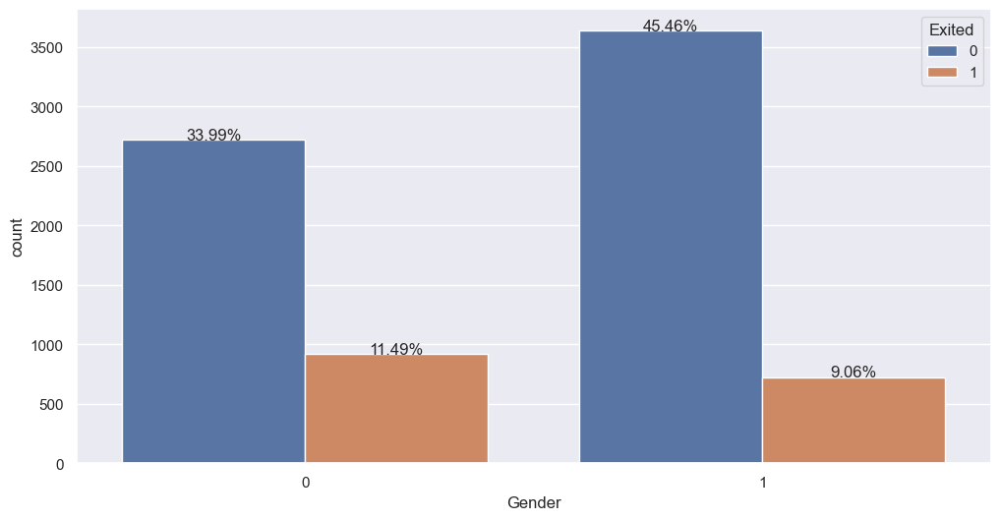

In [29]:
# Gender 
ax1 = sns.countplot(x = 'Gender', hue = 'Exited', data = df4)
show_percentage(ax1, df4)

#### 4.1.2 Geography

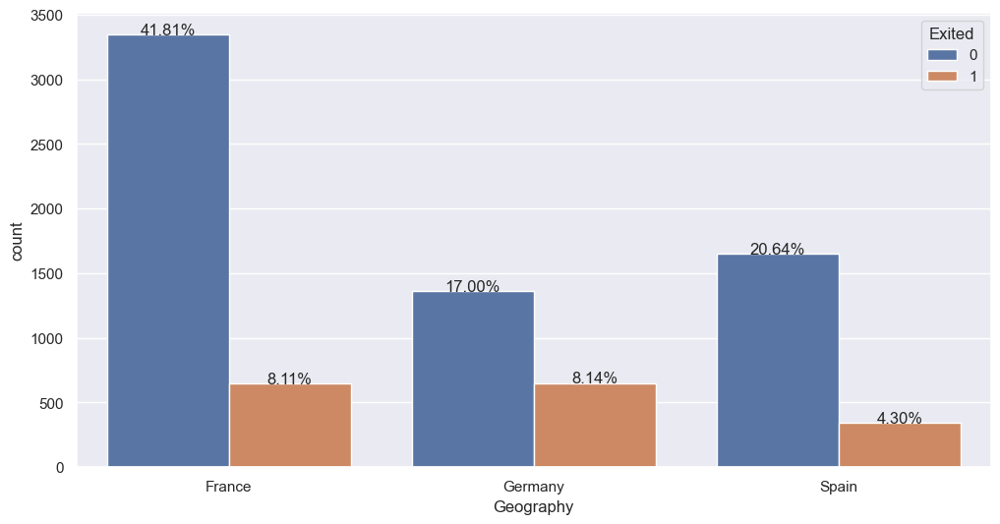

In [30]:
ax2 = sns.countplot(x = 'Geography', hue = 'Exited', data = df4)
show_percentage(ax2, df4)

#### 4.1.3 Age

Distruibuição normal entre as varaiveis Age e Exited.
Observado muitos outliers na variavel Age quando se trata de clientes que não cancelaram

<Axes: xlabel='Exited', ylabel='Age'>

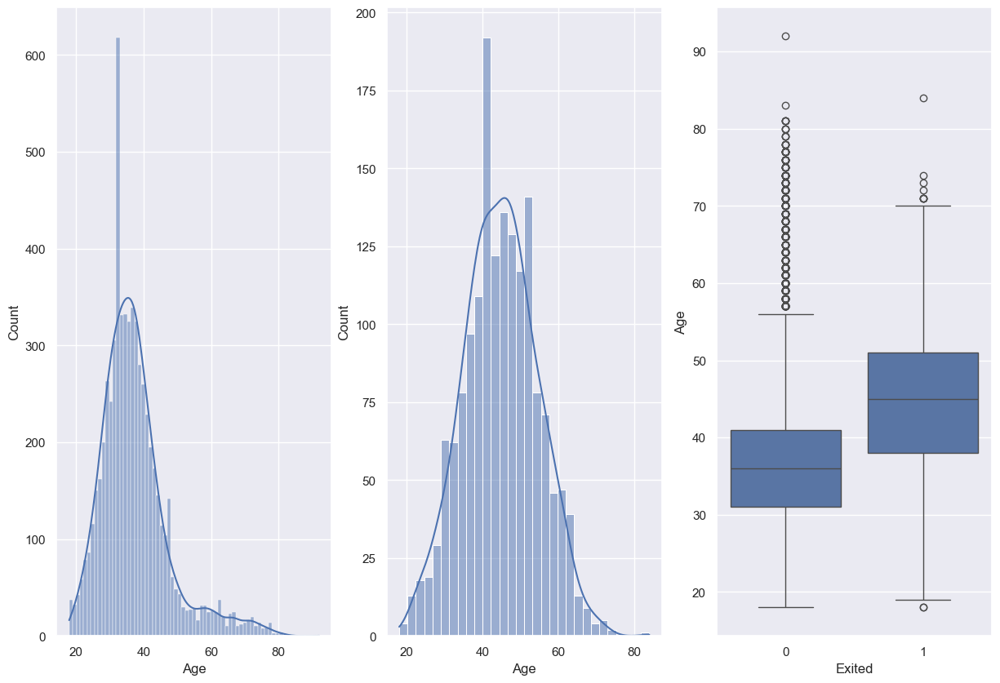

In [31]:
# Age
plt.figure(figsize = (20, 10))
aux_0 = df4.loc[df4['Exited'] == 0, 'Age']
aux_1 = df4.loc[df4['Exited'] == 1, 'Age']

plt.subplot(1, 4, 1)
sns.histplot(aux_0, kde = True)

plt.subplot(1, 4, 2)
sns.histplot(aux_1, kde = True);

plt.subplot(1, 4, 3)
sns.boxplot(x = df4['Exited'], y = df4['Age'])

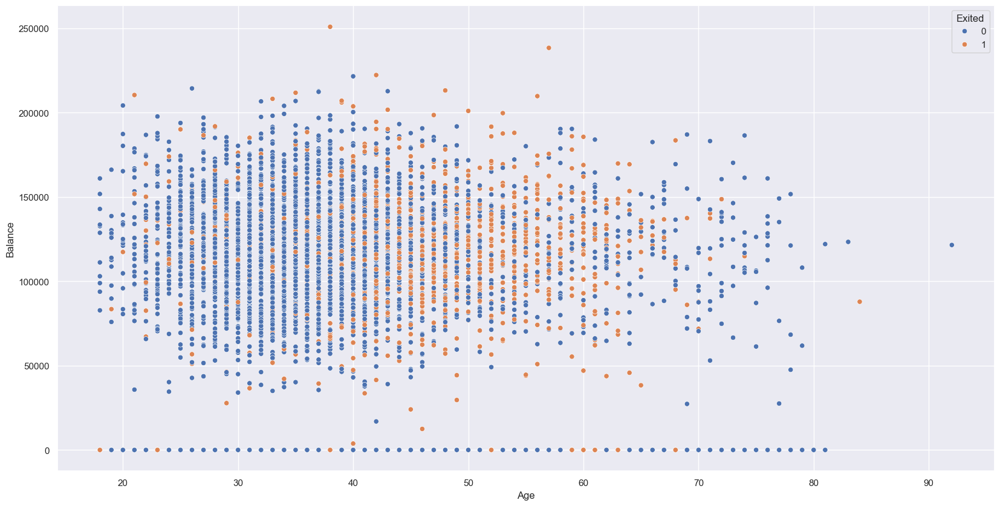

In [32]:
plt.figure(figsize = (20, 10))
sns.scatterplot(x = 'Age', y = 'Balance', data = df4, hue = 'Exited');

#### 4.1.4 Credit Score

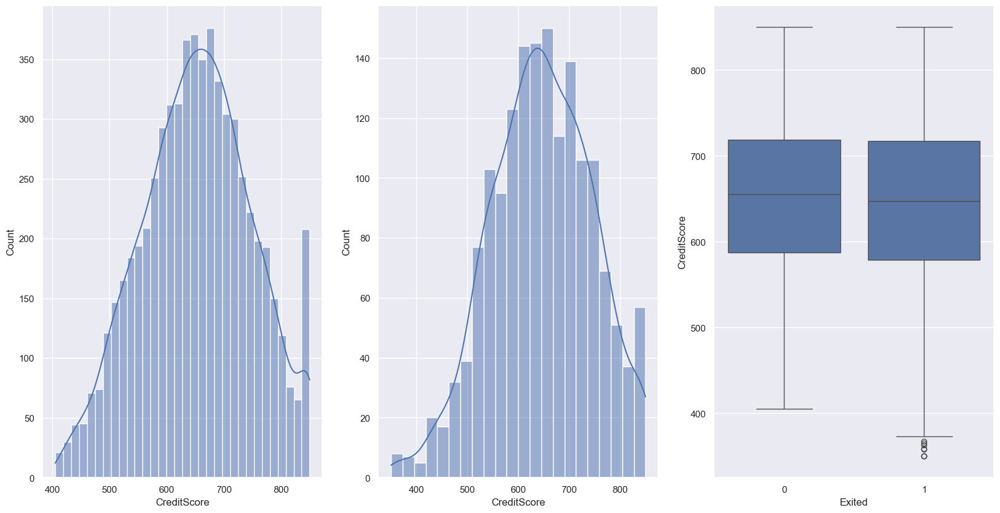

In [33]:
# Age
plt.figure(figsize = (20, 10))
aux_0 = df4.loc[df4['Exited'] == 0, 'CreditScore']
aux_1 = df4.loc[df4['Exited'] == 1, 'CreditScore']

plt.subplot(1, 3, 1)
sns.histplot(aux_0, kde = True)

plt.subplot(1, 3, 2)
sns.histplot(aux_1, kde = True);

plt.subplot(1, 3, 3)
sns.boxplot(x = df4['Exited'], y = df4['CreditScore']);

#### 4.1.5 Tenure

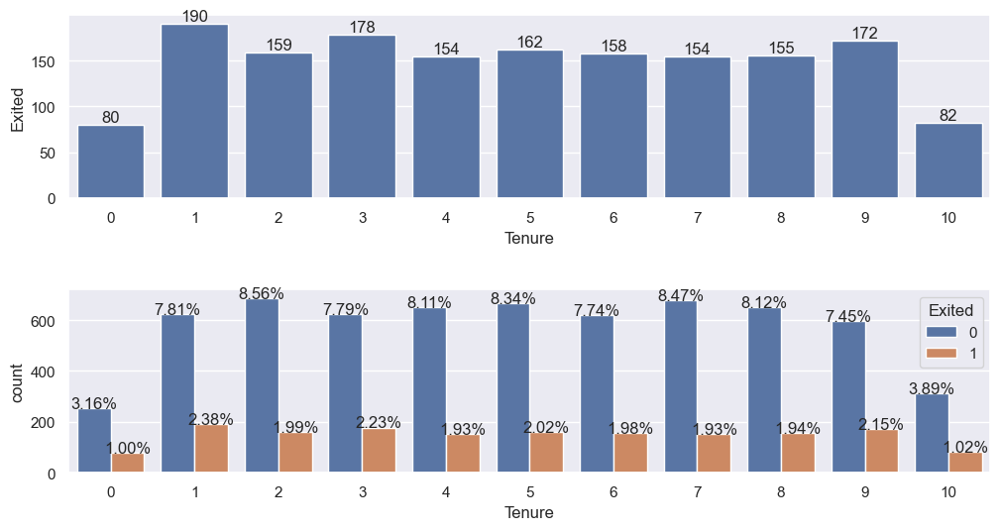

In [34]:
aux = df4[['Tenure', 'Exited']].groupby('Tenure').sum().reset_index()

plt.subplot(2, 1, 1)
ax = sns.barplot(x = 'Tenure', y = 'Exited', data = aux)
ax.bar_label(ax.containers[0])

plt.subplot(2, 1, 2)
ax1 = sns.countplot(x='Tenure', hue='Exited', data=df4)
show_percentage(ax1, df4)

# Ajustar o espaçamento entre os subplots
plt.subplots_adjust(hspace=0.5);


#### 4.1.6 Balance

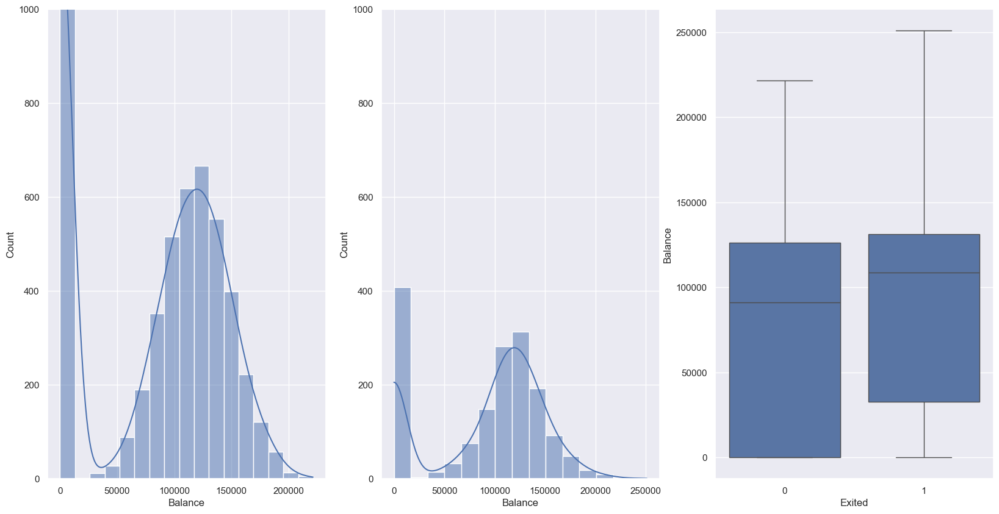

In [35]:
# Age
plt.figure(figsize = (20, 10))
aux_0 = df4.loc[df4['Exited'] == 0, 'Balance']
aux_1 = df4.loc[df4['Exited'] == 1, 'Balance']

max_y = max(aux_0.max(), aux_1.max())

plt.subplot(1, 3, 1)
sns.histplot(aux_0, kde = True)
plt.ylim(0, 1000)

plt.subplot(1, 3, 2)
sns.histplot(aux_1, kde = True)
plt.ylim(0, 1000)

plt.subplot(1, 3, 3)
sns.boxplot(x = df4['Exited'], y = df4['Balance']);

#### 4.1.7 NumOfProducts

More than 90% of the customers are between 1 or 2 NumOfProducts

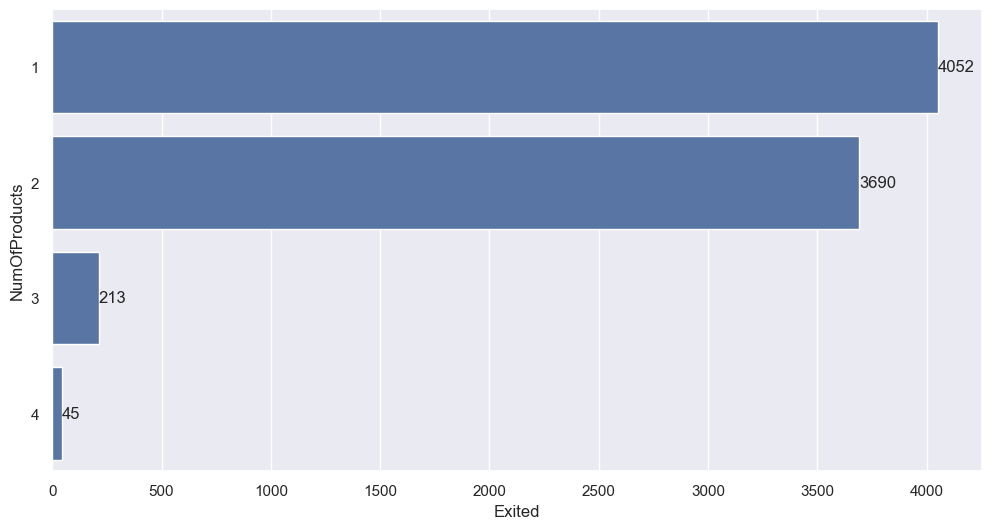

In [36]:
aux = df4[['NumOfProducts', 'Exited']].groupby('NumOfProducts').count().reset_index()


ax = sns.barplot(x='Exited', y= 'NumOfProducts', data = aux, orient = 'h')
ax.bar_label(ax.containers[0]);

#### 4.1.8 HasCrCard

Clients with no credit card exited less than others

In [37]:
dl = pd.crosstab(df4['HasCrCard'], df4['Exited']).apply(lambda x: x / x.sum(), axis = 1)
dl

Exited,0,1
HasCrCard,,
0,0.790472,0.209528
1,0.796198,0.203802


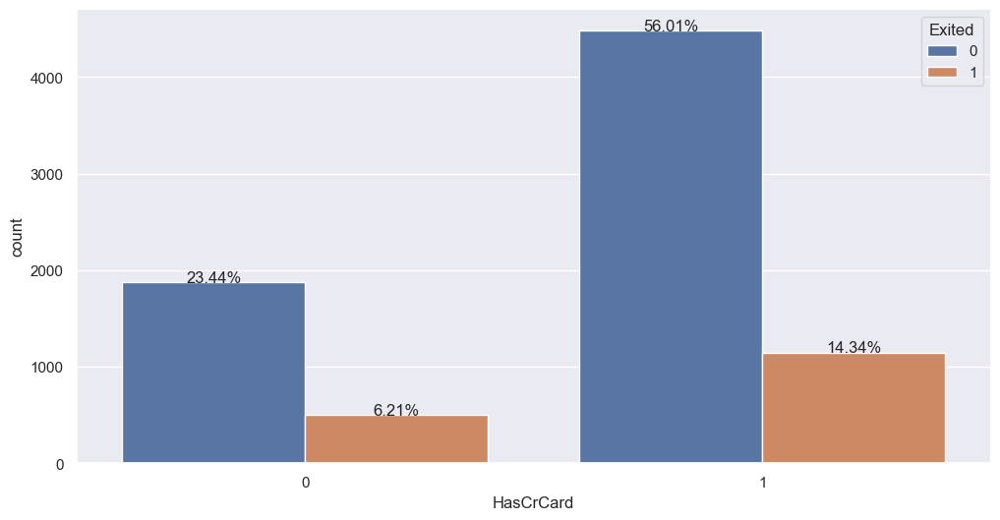

In [38]:
ax1 = sns.countplot(x = 'HasCrCard', hue = 'Exited', data = df4)
show_percentage(ax1, df4)

#### 4.1.9 IsActiveMember

Active members exited less than others

In [39]:
dl = pd.crosstab(df4['IsActiveMember'], df4['Exited']).apply(lambda x: x / x.sum(), axis = 1)
dl


Exited,0,1
IsActiveMember,,
0,0.729605,0.270395
1,0.856168,0.143832


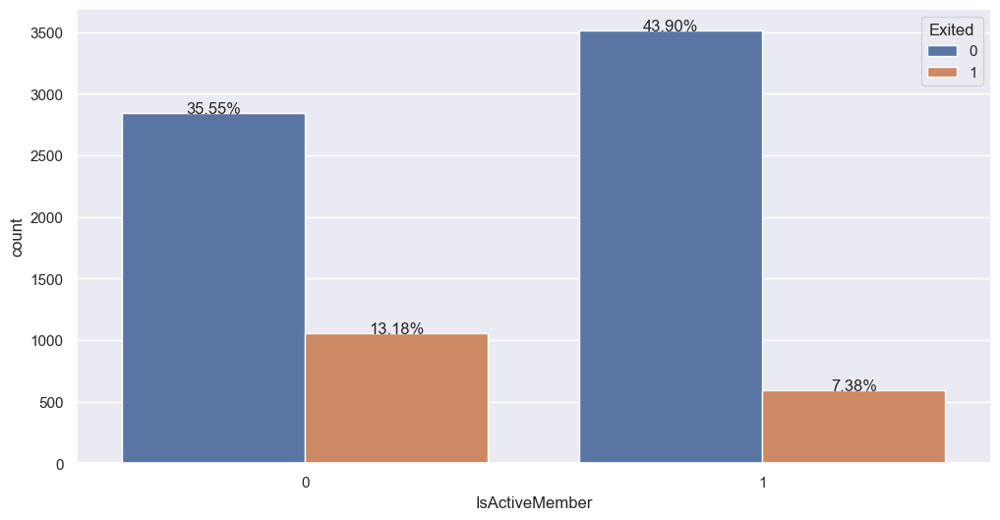

In [40]:
ax1 = sns.countplot(x = 'IsActiveMember', hue = 'Exited', data = df4)
show_percentage(ax1, df4)

#### 4.1.10 EstimatedSalary

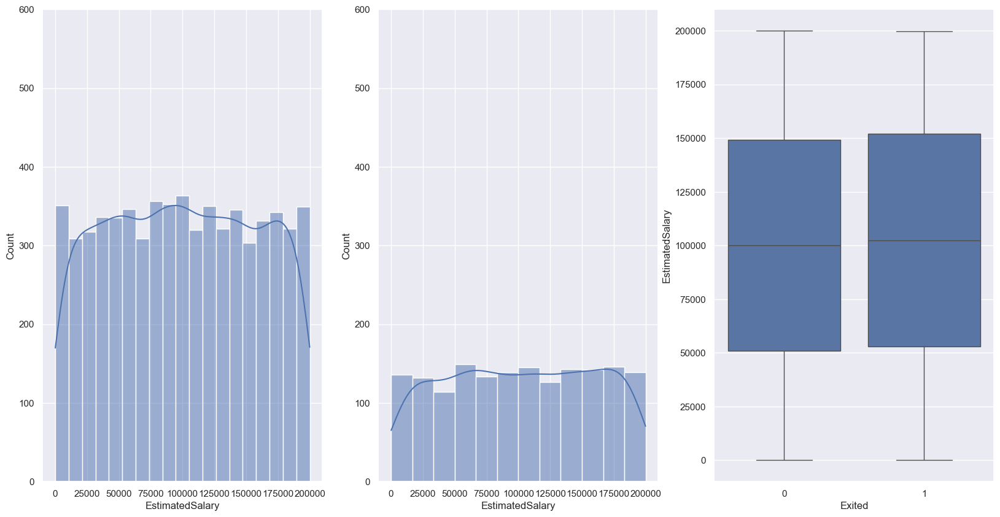

In [41]:
# Age
plt.figure(figsize = (20, 10))
aux_0 = df4.loc[df4['Exited'] == 0, 'EstimatedSalary']
aux_1 = df4.loc[df4['Exited'] == 1, 'EstimatedSalary']

max_y = max(aux_0.max(), aux_1.max())

plt.subplot(1, 3, 1)
sns.histplot(aux_0, kde = True)
plt.ylim(0, 600)

plt.subplot(1, 3, 2)
sns.histplot(aux_1, kde = True)
plt.ylim(0, 600)

plt.subplot(1, 3, 3)
sns.boxplot(x = df4['Exited'], y = df4['EstimatedSalary']);

#### 4.1.11 Credit Status

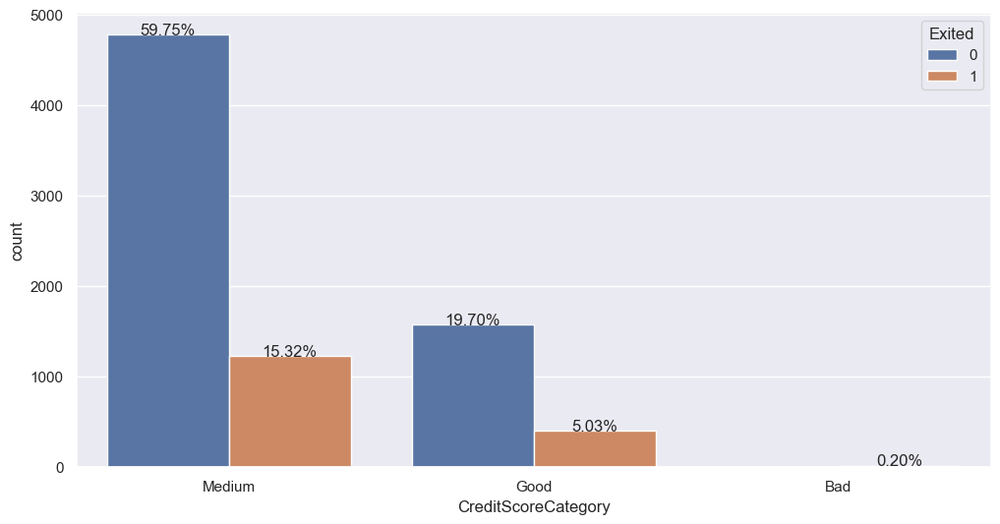

In [42]:
ax1 = sns.countplot(x='CreditScoreCategory', hue='Exited', data=df4)
show_percentage(ax1, df4)

#### 4.1.12 Age Group

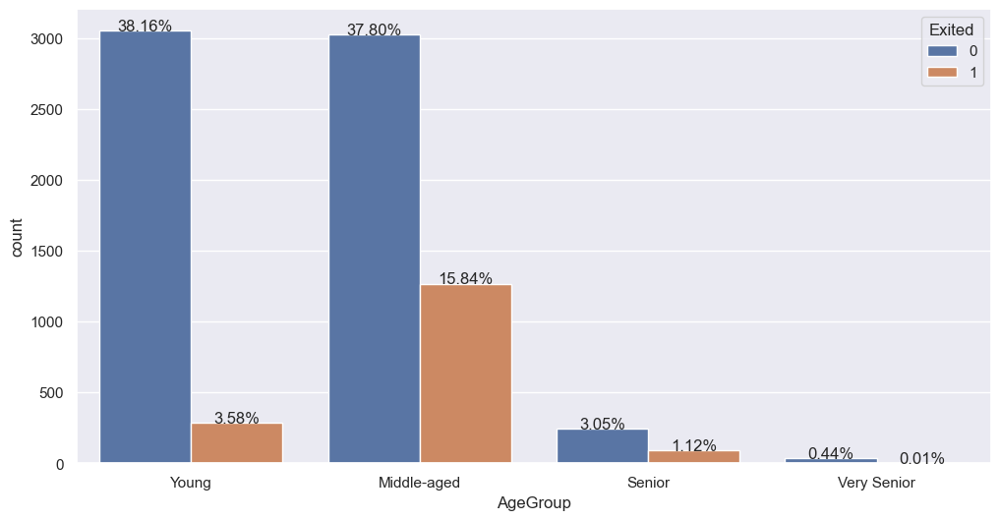

In [43]:
ax1 = sns.countplot(x='AgeGroup', hue='Exited', data=df4)
show_percentage(ax1, df4)

In [44]:
df4.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,CreditScoreCategory,AgeGroup,IsSeniorCitizen,BalanceSalaryRatio,AgeBalanceInteraction,Exited
9254,686,France,1,32,6,0.00,2,1,1,179093.26,Medium,Young,0,0.000000,0.000000,0
1561,632,Germany,1,42,4,119624.60,2,1,1,195978.86,Medium,Middle-aged,0,0.610395,2848.204762,0
1670,559,Spain,1,24,3,114739.92,1,1,0,85891.02,Medium,Young,0,1.335878,4780.830000,1
6087,561,France,0,27,9,135637.00,1,1,0,153080.40,Medium,Young,0,0.886051,5023.592593,1
6669,517,France,1,56,9,142147.32,1,0,0,39488.04,Medium,Middle-aged,0,3.599756,2538.345000,1


#### 4.1.13 Is Senior Citizen

In [45]:
dl = pd.crosstab(df4['IsSeniorCitizen'], df4['Exited']).apply(lambda x: x / x.sum(), axis = 1)
dl

Exited,0,1
IsSeniorCitizen,,
0,0.798812,0.201188
1,0.717647,0.282353


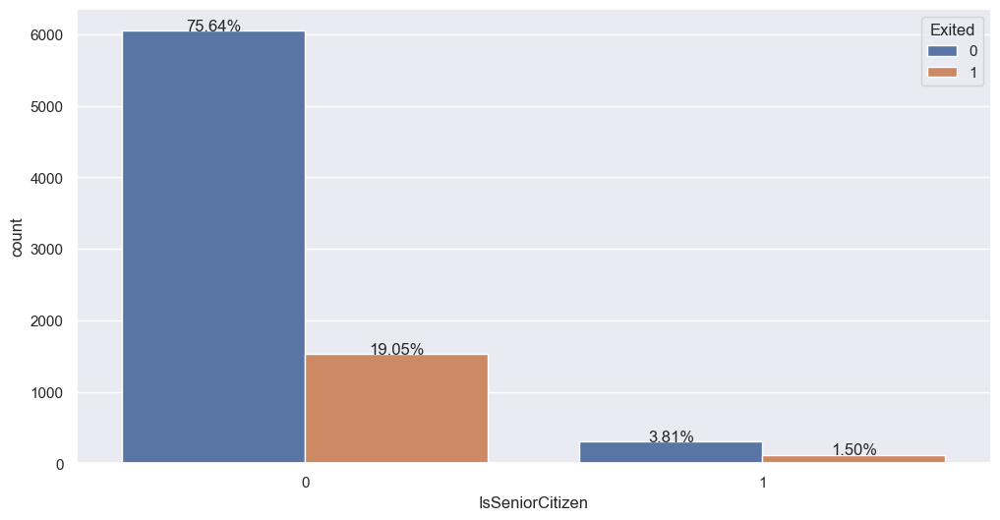

In [46]:
ax1 = sns.countplot(x='IsSeniorCitizen', hue='Exited', data=df4)
show_percentage(ax1, df4)

In [47]:
data_raw.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


### 4.2 Análise Bivariada

1. Clientes 
    - 1.1 Clientes do genero feminino tem 30% a mais de churn do que homens.
    - 1.2 Clientes com somente um produto são os que mais dão churn.
    - 1.3 Clientes com salário abaixo de 50.000 dão 20% mais churn que os demais.
    - 1.4 Clientes com saldo entre 0 e 100 mil dão mais churn do que os demais.
    - 1.5 Clientes entre 20 e 39 anos dão mais churn do que clientes acima de 40
    - 1.6 Clientes ativos tem 30% a menos de churn do que clientes pouco ativos.
    - 1.7 Clientes da Alemanha tem 30% a mais de cancelamento do que Franca e Espanha juntos
    - 1.8 Clientes com um Credit Score abaixo da média tem 30% a mais de chance de dar churn




3. Tempo
    - 3.1 Clientes de 1 a 3 anos de contrato tem 50% de chance a mais do que clientes de 4 ou mais.


#### 4.2.1 Clientes do genero feminino tem 30% a mais de churn do que homens.

- **False:** Clientes do genero feminino tem apenas 11,8% a mais de churn do que homens.

In [48]:
h1_data = data_raw.loc[data_raw['Exited'] == 1, :]

h1 = h1_data[['CustomerId', 'Gender', 'Exited']].groupby(['Gender', 'Exited']).count().reset_index()


fig = make_subplots(
    rows=1, cols=3, 
    specs=[[{"type": "xy"}, {"type": "domain"}, {"type": "xy"}]],  # Especifica tipos de eixos: 'xy' para gráficos de barras e 'domain' para gráficos de pizza
    subplot_titles=("Total Churn per Gender", "Percentage Churn per Gender",  "Heatmap")
)


bar_fig = px.bar(h1, 
                 x = 'Gender', 
                 y = 'CustomerId', 
                 text= 'CustomerId',
                 color_discrete_sequence=['#c44e52', '#636efa'],
                 labels={'Value': 'Percentage (%)'})


for trace in bar_fig['data']:
    fig.add_trace(trace, row=1, col=1)

# Gráfico de pizza
pie_fig = px.pie(h1, 
                 values='CustomerId', 
                 color='Gender', 
                 hole=.5,
                 color_discrete_sequence=['#c44e52', '#636efa'])

for trace in pie_fig['data']:
    fig.add_trace(trace, row=1, col=2)



# Heatmap
data_raw['Gender_Binary'] = data_raw['Gender'].apply(lambda x: 1 if x == 'Female' else 0)
heatmap_data = data_raw[['Exited', 'Gender_Binary']].corr(method='pearson').values

heatmap = go.Heatmap(
    z=heatmap_data,
    x=['Exited', 'Gender_Binary'],
    y=['Exited', 'Gender_Binary'],
    colorscale='Electric',
    texttemplate='%{text:.2f}',
    text=heatmap_data,
    showscale=False
)

fig.add_trace(heatmap, row=1, col=3)


fig.update_layout(coloraxis_showscale=False,
                   font=dict(size= 15),
                   height=600, width=1800)

fig.show()
#sns.heatmap(data_raw[['Exited', 'Gender_Binary']].corr(method='pearson'), annot=True);


#### 4.2.2 Clientes com somente um produto são os que mais dão churn.

- **True:** Clientes com somente um produto são os que mais dão Churn, sendo eles quase 70% da base referente a clientes que entraram em churn

In [49]:

h2_data = data_raw.loc[data_raw['Exited'] == 1, :]

h2 = h2_data[['CustomerId', 'NumOfProducts', 'Exited']].groupby(['NumOfProducts', 'Exited']).count().reset_index()


fig = make_subplots(
    rows=1, cols=3, 
    specs=[[{"type": "xy"}, {"type": "domain"}, {"type": "xy"}]],  # Especifica tipos de eixos: 'xy' para gráficos de barras e 'domain' para gráficos de pizza
    subplot_titles=("Total Churn per Product Number", "Percentual Churn per Product Number", "Heatmap"),
)

bar_fig = px.bar(h2,
              x='NumOfProducts',
              y='CustomerId',
              color_discrete_sequence=['#c44e52', '#636efa'],
              text='CustomerId'
              )
              

for trace in bar_fig['data']:
    fig.add_trace(trace, row=1, col=1)

# Gráfico de pizza
pie_fig = px.pie(h2, 
                 values='CustomerId', 
                 color='NumOfProducts', 
                 hole=.5 
                 )

for trace in pie_fig['data']:
    fig.add_trace(trace, row=1, col=2)



# Heatmap
heatmap_data = data_raw[['Exited', 'NumOfProducts']].corr(method='spearman').values

heatmap = go.Heatmap(
    z=heatmap_data,
    x=['Exited', 'NumOfProducts'],
    y=['Exited', 'NumOfProducts'],
    colorscale='Electric',
    texttemplate='%{text:.2f}',
    text=heatmap_data,
    showscale=False
)

fig.add_trace(heatmap, row=1, col=3)



fig.update_layout(coloraxis_showscale=False,
                   font=dict(size= 15),
                   height=600, width=2000)



fig.show()

#### 4.2.3 Clientes com salário abaixo de 50.000 dão 20% mais churn que os demais.

* **False:** Não tem variação considerável. 

In [50]:
# Definir os bins como strings
bins = list(np.arange(0, 200000, 50000))
bin_labels = [f'{bins[i]}-{bins[i+1]}' for i in range(len(bins)-1)]


aux = data_raw.loc[data_raw['Exited'] == 1, ['CustomerId', 'EstimatedSalary', 'Exited']]
aux['EstimatedSalaryBinned'] = pd.cut(aux['EstimatedSalary'], bins=bins, labels=bin_labels, right=False)

# Agrupar e contar
aux1 = aux[['CustomerId', 'EstimatedSalaryBinned']].groupby('EstimatedSalaryBinned', observed=False).count().reset_index()

fig = make_subplots(
    rows=1, cols=2, 
    subplot_titles=("Total Churn per Salary Binned", "Heatmap"),
)

# Gerar o gráfico de barras
bar_fig = px.bar(aux1,
                 x='EstimatedSalaryBinned',
                 y='CustomerId',
                 color_discrete_sequence=['#c44e52', '#636efa'],
                 text='CustomerId'
                 )

# Adicionar as traces ao subplot
for trace in bar_fig['data']:
    fig.add_trace(trace, row=1, col=1)

fig.update_traces(textposition='outside')

# Heatmap
heatmap_data = data_raw[['Exited', 'EstimatedSalary']].corr(method='pearson').values

heatmap = go.Heatmap(
    z=heatmap_data,
    x=['Exited', 'EstimatedSalary'],
    y=['Exited', 'EstimatedSalary'],
    colorscale='Electric',
    texttemplate='%{text:.2f}',
    text=heatmap_data,
    showscale=False
)

fig.add_trace(heatmap, row=1, col=2)   

fig.update_layout(coloraxis_showscale=False,
                   font=dict(size= 15),
                   height=700, width=1500)


# Exibir o subplot
fig.show()


#### 4.2.4 Clientes com saldo entre 0 e 100 mil dão mais churn do que os demais.

In [51]:
# Definir os bins como strings
bins = list(np.arange(0, 260000, 10000))
bin_labels = [f'{bins[i]}-{bins[i+1]}' for i in range(len(bins)-1)]


aux = data_raw.loc[data_raw['Exited'] == 1, ['CustomerId', 'Balance', 'Exited']]
aux['BalanceBinned'] = pd.cut(aux['Balance'], bins=bins, labels=bin_labels, right=False)

# Agrupar e contar
aux1 = aux[['CustomerId', 'BalanceBinned']].groupby('BalanceBinned', observed=False).count().reset_index()

fig = make_subplots(
    rows=1, cols=2, 
    subplot_titles=("Total Churn per Balance Binned", "Heatmap"),
)

# Gerar o gráfico de barras
bar_fig = px.bar(aux1,
                 x='BalanceBinned',
                 y='CustomerId',
                 color_discrete_sequence=['#c44e52', '#636efa'],
                 text='CustomerId'
                 )

# Adicionar as traces ao subplot
for trace in bar_fig['data']:
    fig.add_trace(trace, row=1, col=1)

fig.update_traces(textposition='outside')

# Heatmap
heatmap_data = data_raw[['Exited', 'Balance']].corr(method='pearson').values

heatmap = go.Heatmap(
    z=heatmap_data,
    x=['Exited', 'Balance'],
    y=['Exited', 'Balance'],
    colorscale='Electric',
    texttemplate='%{text:.2f}',
    text=heatmap_data,
    showscale=False
)

fig.add_trace(heatmap, row=1, col=2)   

fig.update_layout(coloraxis_showscale=False,
                   font=dict(size= 15),
                   height=700, width=1500)


# Exibir o subplot
fig.show()

#### 4.3.5 Clientes entre 20 e 39 anos dão mais churn do que clientes acima de 40x

In [52]:
aux = data_raw.loc[(data_raw['Age'].between(20, 39)) & (data_raw['Exited'] == 1), ['CustomerId', 'Age', 'Exited']]
aux = aux.groupby(['Age', 'Exited']).count().reset_index()

aux1 = data_raw.loc[(data_raw['Age'] >= 40) & (data_raw['Exited'] == 1), ['CustomerId', 'Age', 'Exited']]
aux1 = aux1.groupby(['Age', 'Exited']).count().reset_index()

In [53]:
fig = make_subplots(
    rows=2, cols=2, 
    subplot_titles=("Churn per Age (20-39)", "Heatmap", "Churn per Age (40+)"),
     specs=[[{"type": "bar"}, {"type": "heatmap", "rowspan": 2}],
           [{"type": "bar"}, None]],
)

# Gerar o gráfico de barras
bar_fig = px.bar(aux,
                 x='Age',
                 y='CustomerId',
                 color_discrete_sequence=['#c44e52', '#636efa'],
                 text='CustomerId'
                 )

# Adicionar as traces ao subplot
for trace in bar_fig['data']:
    fig.add_trace(trace, row=1, col=1)


# Gerar o gráfico de barras
bar_fig2 = px.bar(aux1,
                 x='Age',
                 y='CustomerId',
                 color_discrete_sequence=['#c44e52', '#636efa'],
                 text='CustomerId'
                 )

# Adicionar as traces ao subplot
for trace in bar_fig2['data']:
    fig.add_trace(trace, row=2, col=1)



# Heatmap
heatmap_data = data_raw[['Exited', 'Age']].corr(method='spearman').values

heatmap = go.Heatmap(
    z=heatmap_data,
    x=['Exited', 'Age'],
    y=['Exited', 'Age'],
    colorscale='Electric',
    texttemplate='%{text:.2f}',
    text=heatmap_data,
    showscale=False
)

fig.add_trace(heatmap, row=1, col=2)   



fig.update_layout(coloraxis_showscale=False,
                   font=dict(size= 15),
                   height=800, width=1500)


# Exibir o subplot
fig.show()

#### 4.3.6 Clientes ativos tem 30% a menos de churn do que clientes pouco ativos.

In [54]:
aux = data_raw.loc[(data_raw['IsActiveMember'] == 1) & (data_raw['Exited'] == 1), ['CustomerId', 'IsActiveMember', 'Exited']]
aux = aux.groupby(['IsActiveMember', 'Exited']).count().reset_index()

aux1 = data_raw.loc[(data_raw['IsActiveMember'] == 0) & (data_raw['Exited'] == 1), ['CustomerId', 'IsActiveMember', 'Exited']]
aux1 = aux1.groupby(['IsActiveMember', 'Exited']).count().reset_index()


fig = make_subplots(
    rows=2, cols=2, 
    subplot_titles=("Churn per IsActiveMember = 1", "Heatmap", "Churn per IsActiveMember = 0"),
     specs=[[{"type": "bar"}, {"type": "heatmap", "rowspan": 2}],
           [{"type": "bar"}, None]],
)

# Gerar o gráfico de barras

bar_fig = px.bar(aux,
                 x='IsActiveMember',
                 y='CustomerId',
                 color_discrete_sequence=['#c44e52', '#636efa'],
                 text='CustomerId'
                 )

# Adicionar as traces ao subplot
for trace in bar_fig['data']:
    trace['width'] = 0.5
    fig.add_trace(trace, row=1, col=1)



bar_fig2 = px.bar(aux1,
                 x='IsActiveMember',
                 y='CustomerId',
                 color_discrete_sequence=['#c44e52', '#636efa'],
                 text='CustomerId'
                 )

# Adicionar as traces ao subplot
for trace in bar_fig2['data']:
    trace['width'] = 0.5
    fig.add_trace(trace, row=2, col=1)

    
# Heatmap
heatmap_data = data_raw[['Exited', 'Age']].corr(method='pearson').values

heatmap = go.Heatmap(
    z=heatmap_data,
    x=['Exited', 'Age'],
    y=['Exited', 'Age'],
    colorscale='Electric',
    texttemplate='%{text:.2f}',
    text=heatmap_data,
    showscale=False
)

fig.add_trace(heatmap, row=1, col=2)   



fig.update_layout(coloraxis_showscale=False,
                   font=dict(size= 15),
                   height=800, width=1500)

# Ajustar o range do eixo y para os gráficos de barras
fig.update_yaxes(range=[0, 2000], row=1, col=1)
fig.update_yaxes(range=[0, 2000], row=2, col=1)


# Exibir o subplot
fig.show()

#### 4.3.7 Clientes de 1 a 3 anos de contrato tem 50% de chance a mais do que clientes de 4 ou mais.

In [55]:
aux = data_raw[data_raw['Exited'] == 1]
aux1 = aux[['CustomerId', 'Tenure', 'Exited']].groupby(['Tenure', 'Exited']).count().reset_index()

fig = make_subplots(
    rows=1, cols=2, 
    subplot_titles=("Churn per Tenure", "Heatmap", ),
     specs=[[{"type": "bar"}, {"type": "heatmap"}]])

# Gerar o gráfico de barras

bar_fig = px.bar(aux1,
                 x='Tenure',
                 y='CustomerId',
                 color_discrete_sequence=['#c44e52', '#636efa'],
                 text='CustomerId'
                 )

# Adicionar as traces ao subplot
for trace in bar_fig['data']:
    trace['width'] = 0.7
    fig.add_trace(trace, row=1, col=1)

    
# Heatmap
heatmap_data = data_raw[['Exited', 'Tenure']].corr(method='spearman').values

heatmap = go.Heatmap(
    z=heatmap_data,
    x=['Exited', 'Tenure'],
    y=['Exited', 'Tenure'],
    colorscale='Electric',
    texttemplate='%{text:.2f}',
    text=heatmap_data,
    showscale=False
)

fig.add_trace(heatmap, row=1, col=2)   



fig.update_layout(coloraxis_showscale=False,
                   font=dict(size= 15),
                   height=800, width=1500)

# Ajustar o range do eixo y para os gráficos de barras
fig.update_yaxes(range=[0, 500], row=1, col=1)
fig.update_yaxes(range=[0, 500], row=2, col=1)


# Exibir o subplot
fig.show()

#### 4.3.8 Clientes da Alemanha tem 30% a mais de cancelamento do que Franca e Espanha juntos

In [56]:
aux = data_raw[['CustomerId', 'Geography', 'Exited']].groupby(['Geography', 'Exited']).count().sort_values('CustomerId', ascending=False).reset_index()

fig = make_subplots(
    rows=1, cols=2, 
    subplot_titles=("Churn per Tenure", "Heatmap", ),
     specs=[[{"type": "bar"}, {"type": "heatmap"}]])

# Gerar o gráfico de barras

bar_fig = px.histogram(aux,
                 x='Geography',
                 y='CustomerId',
                 color='Exited',
                 barmode='group',
                 text_auto='CustomerId'

                 #text='CustomerId'
                 )


# Adicionar as traces ao subplot
for trace in bar_fig['data']:
    fig.add_trace(trace, row=1, col=1)

# Crie uma matriz de correlação para o heatmap
cramers_v = cramer_v(x=data_raw['Geography'], y=data_raw['Exited'])

correlation_matrix = pd.DataFrame([[1, cramers_v], [cramers_v, 1]],
                                  index=['Exited', 'Geography'],
                                  columns=['Exited', 'Geography'])

# Adicionar o heatmap
heatmap_trace = go.Heatmap(
    z=correlation_matrix.values,
    x=['Exited', 'Geography'],
    y=['Exited', 'Geography'],
    colorscale='Electric',
    texttemplate='%{text:.2f}',
    text=correlation_matrix,
    showscale=False
)

fig.add_trace(heatmap_trace, row=1, col=2)

# Ajustar layout para melhor visualização
fig.update_layout(
    barmode='group',  # Garantir que as barras sejam lado a lado
    title_text='Customer Count by Geography and Exited Status',
    xaxis_title='Geography',
    yaxis_title='Customer Count',
    font=dict(size=15),
    height=600, width=1200,
    coloraxis_showscale=False
)

# Exibir o gráfico
fig.show()


### 4.1.3 Análise Multivariada

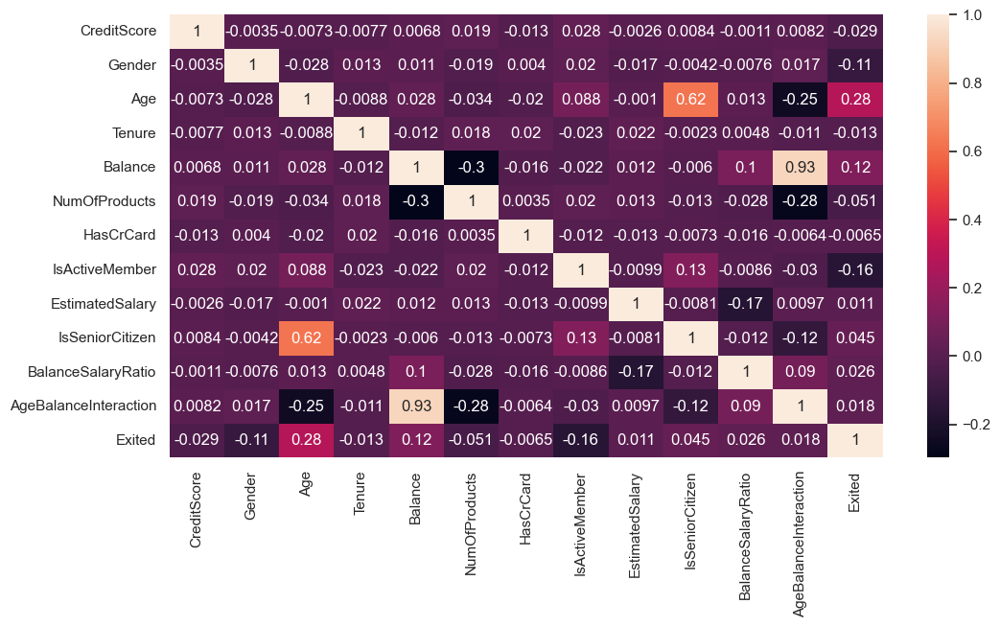

In [57]:
num_attributes = df4.select_dtypes(include=['int64', 'float64'])
sns.heatmap(num_attributes.corr(method='pearson'), annot=True);

## 5.0. DATA PREPARATION

In [58]:
df5 = df4.copy()

In [59]:
df5.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,CreditScoreCategory,AgeGroup,IsSeniorCitizen,BalanceSalaryRatio,AgeBalanceInteraction,Exited
9254,686,France,1,32,6,0.00,2,1,1,179093.26,Medium,Young,0,0.000000,0.000000,0
1561,632,Germany,1,42,4,119624.60,2,1,1,195978.86,Medium,Middle-aged,0,0.610395,2848.204762,0
1670,559,Spain,1,24,3,114739.92,1,1,0,85891.02,Medium,Young,0,1.335878,4780.830000,1
6087,561,France,0,27,9,135637.00,1,1,0,153080.40,Medium,Young,0,0.886051,5023.592593,1
6669,517,France,1,56,9,142147.32,1,0,0,39488.04,Medium,Middle-aged,0,3.599756,2538.345000,1


<Figure size 2000x1000 with 0 Axes>

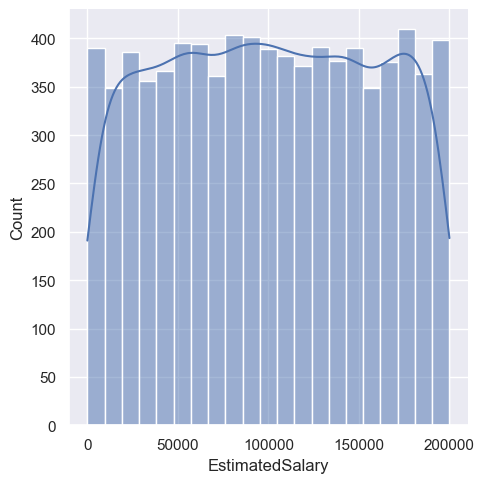

In [60]:
plt.figure(figsize = (20, 10))
sns.displot(df5['EstimatedSalary'], kde = True);

### 5.1 Training Dataset

#### 5.1.1 Normalização

In [61]:
# Standard Scaler

ssc_creditscore = pp.StandardScaler()
ssc_balance = pp.StandardScaler()

x_train['CreditScore'] = ssc_creditscore.fit_transform(x_train[['CreditScore']].values)
x_train['Balance'] = ssc_balance.fit_transform(x_train[['Balance']].values)

#### 5.1.2 Reescala

In [62]:
rs_age = pp.RobustScaler()
x_train['Age'] = rs_age.fit_transform(x_train[['Age']].values)

In [63]:
mms_tenure = pp.MinMaxScaler()
mms_numofproducts = pp.MinMaxScaler()
mms_agebalance = pp.MinMaxScaler()
mms_balancesalary = pp.MinMaxScaler()
mms_estimatedsalary = pp.MinMaxScaler()

x_train['Tenure'] = mms_tenure.fit_transform(x_train[['Tenure']].values)
x_train['NumOfProducts'] = mms_numofproducts.fit_transform(x_train[['NumOfProducts']].values)
x_train['AgeBalanceInteraction'] = mms_agebalance.fit_transform(x_train[['AgeBalanceInteraction']].values)
x_train['EstimatedSalary'] = mms_estimatedsalary.fit_transform(x_train[['EstimatedSalary']].values)
x_train['BalanceSalaryRatio'] = mms_balancesalary.fit_transform(x_train[['BalanceSalaryRatio']].values)

#### 5.1.3 Encoders

In [64]:
# Target Encoder
# vehicle age
x_train = pd.get_dummies(x_train, prefix='Geography', columns=['Geography'], dtype=int)

target_encoding_agegroup = df5.groupby('AgeGroup')['Exited'].mean()
x_train.loc[:, 'AgeGroup'] = x_train['AgeGroup'].map(target_encoding_agegroup)

target_encoding_creditcategory = df5.groupby('CreditScoreCategory')['Exited'].mean()
x_train.loc[:, 'CreditScoreCategory'] = x_train['CreditScoreCategory'].map(target_encoding_creditcategory)

/tmp/ipykernel_915162/2953313235.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_915162/2953313235.py:6: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.085654, 0.295269, 0.085654, 0.085654, 0.295269, ..., 0.295269, 0.295269, 0.295269, 0.295269, 0.295269]
Length: 8000
Categories (4, float64): [0.085654 < 0.295269 < 0.269461 < 0.027778]' has dtype incompatible with category, please explicitly cast to a compatible dtype first.



### 5.2 Test Dataset

#### 5.2.1 Normalização

In [65]:
x_test['CreditScore'] = ssc_creditscore.transform(x_test[['CreditScore']].values)
x_test['Balance'] = ssc_balance.transform(x_test[['Balance']].values)

#### 5.2.2 Reescala

In [66]:
x_test['Tenure'] = mms_tenure.transform(x_test[['Tenure']].values)
x_test['NumOfProducts'] = mms_numofproducts.transform(x_test[['NumOfProducts']].values)
x_test['AgeBalanceInteraction'] = mms_agebalance.transform(x_test[['AgeBalanceInteraction']].values)
x_test['EstimatedSalary'] = mms_estimatedsalary.transform(x_test[['EstimatedSalary']].values)
x_test['BalanceSalaryRatio'] = mms_balancesalary.transform(x_test[['BalanceSalaryRatio']].values)

x_test['Age'] = rs_age.transform(x_test[['Age']].values)

#### 5.2.3 Encoders

In [67]:
# Target Encoder
x_test = pd.get_dummies(x_test, prefix='Geography', columns=['Geography'], dtype=int)
x_test.loc[:, 'AgeGroup'] = x_test['AgeGroup'].map(target_encoding_agegroup)
x_test.loc[:, 'CreditScoreCategory'] = x_test['CreditScoreCategory'].map(target_encoding_creditcategory)

/tmp/ipykernel_915162/385712931.py:3: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.085654, 0.295269, 0.295269, 0.295269, 0.085654, ..., 0.295269, 0.085654, 0.295269, 0.085654, 0.295269]
Length: 2000
Categories (4, float64): [0.085654 < 0.295269 < 0.269461 < 0.027778]' has dtype incompatible with category, please explicitly cast to a compatible dtype first.



## 6.0. FEATURE SELECTION

In [68]:
x_train_n = x_train.loc[:, ~x_train.columns.isin(['RowNumber', 'CustomerId', 'Exited'])]
y_train_n = y_train.values

### 6.1 Feature Importance

In [69]:
forest = en.ExtraTreesClassifier(n_estimators = 250, random_state=0, n_jobs = -1)
feature_names = [f"feature {i}" for i in range(x_train_n.shape[1])]

forest.fit(x_train_n, y_train_n)

ExtraTreesClassifier(n_estimators=250, n_jobs=-1, random_state=0)

Feature ranking:
                 feature  importance
0                    Age    0.154363
0          NumOfProducts    0.136482
0        EstimatedSalary    0.093670
0            CreditScore    0.093188
0                 Tenure    0.083141
0  AgeBalanceInteraction    0.082057
0                Balance    0.079685
0     BalanceSalaryRatio    0.063608
0               AgeGroup    0.052469
0         IsActiveMember    0.039729
0    CreditScoreCategory    0.026020
0              HasCrCard    0.025815
0      Geography_Germany    0.020587
0                 Gender    0.020148
0       Geography_France    0.010742
0        IsSeniorCitizen    0.009262
0        Geography_Spain    0.009034


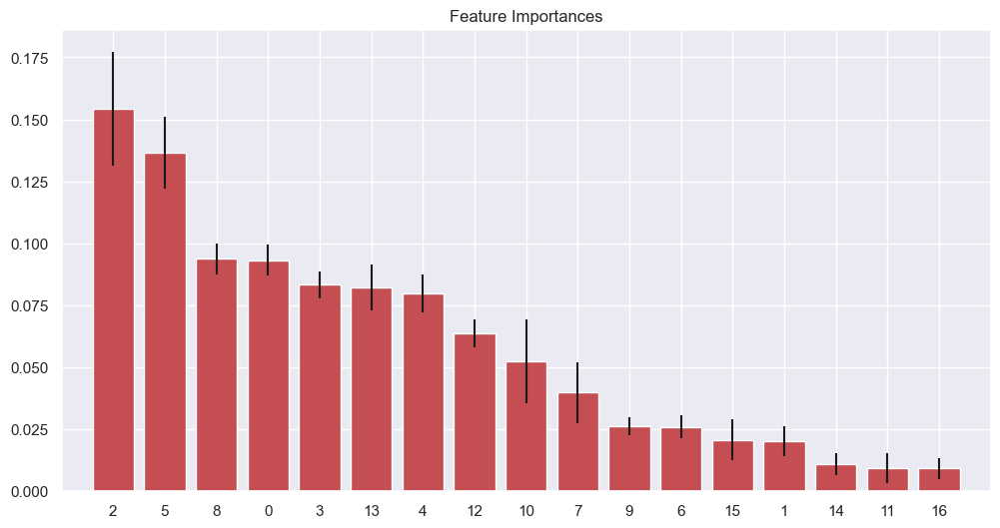

In [70]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
df = pd.DataFrame()
for i, j in zip(x_train_n, importances):
    aux = pd.DataFrame({'feature': i, 'importance':j}, index=[0])
    df = pd.concat([df, aux], axis = 0)

print(df.sort_values('importance' ,ascending= False))
    
# Plot
plt.figure()
plt.title("Feature Importances")
plt.bar(range(x_train_n.shape[1]), importances[indices], color="r", yerr=std[indices], align = "center")
plt.xticks(range(x_train_n.shape[1]), indices)
plt.xlim([-1, x_train_n.shape[1]])
plt.show()

### 6.2 Boruta

In [71]:
from boruta import BorutaPy

model = en.RandomForestClassifier(n_estimators = 2000,  random_state=42, n_jobs = -1)
boruta = BorutaPy(model, n_estimators='auto', random_state=42, verbose=2).fit(x_train_n.values, y_train_n)

cols_selected = boruta.support_.tolist()
# best features
X_train_fs = x_train.copy()
cols_selected_boruta = X_train_fs.iloc[:, cols_selected].columns.to_list()
# not_selected_boruta 
#cols_not_selected_boruta = list( np.setdiff1d( X_train_fs.columns, cols_selected_boruta ) )

#cols_selected_boruta

###['CreditScore', 'Age', 'Balance', 'NumOfProducts']
## ['Age', 'Balance', 'NumOfProducts', 'EstimatedSalary']

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
Iteration: 	9 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
Iteration: 	10 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
Iteration: 	11 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
Iteration: 	12 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
Iteration: 	13 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
Iteration: 	14 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
Iteration: 	15 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
Iteration: 	16 / 100
Confirmed: 	2
Tentative: 	4
Rejected: 	11
I

In [72]:
cols_selected_boruta

['Age', 'NumOfProducts', 'AgeBalanceInteraction']

In [73]:
#from sklearn.feature_selection import RFE
#
#model_rfe = en.ExtraTreesClassifier(n_estimators = 2000, random_state=42, n_jobs = -1, class_weight='balanced') 
#rfe = RFE(model_rfe, n_features_to_select=10)
#result = rfe.fit(x_train, y_train)
#
#print("Número de features: {}".format(result.n_features_))

In [74]:
#cols = result.get_support(indices=True)
#x_train.iloc[:, cols]

### 6.4 Best Features

In [75]:
x_train.columns.tolist()

['CreditScore',
 'Gender',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'HasCrCard',
 'IsActiveMember',
 'EstimatedSalary',
 'CreditScoreCategory',
 'AgeGroup',
 'IsSeniorCitizen',
 'BalanceSalaryRatio',
 'AgeBalanceInteraction',
 'Geography_France',
 'Geography_Germany',
 'Geography_Spain']

#### Balance Test

In [76]:
from imblearn.under_sampling import TomekLinks
tl = TomekLinks()
x_train, y_train = tl.fit_resample(x_train, y_train)

#from imblearn.over_sampling import ADASYN
#adasyn = ADASYN(random_state=42)
#x_train, y_train = adasyn.fit_resample(x_train, y_train)

#from imblearn.combine import SMOTETomek
#smote_tomek = SMOTETomek(random_state=42)
#x_train, y_train = smote_tomek.fit_resample(x_train, y_train)

#from imblearn.combine import SMOTEENN
#smoteeenn = SMOTEENN(random_state=42)
#x_train, y_train = smoteeenn.fit_resample(x_train, y_train)


cols_selected = ['CreditScore', 'Age',  'Balance', 'Tenure', 'HasCrCard', 'IsActiveMember',  'NumOfProducts',  'EstimatedSalary', 'Geography_France', 'Geography_Germany', 'Geography_Spain']
x_train = x_train[cols_selected]
x_test = x_test[cols_selected]

In [77]:
y_train.value_counts()

Exited
0    5944
1    1644
Name: count, dtype: int64

In [78]:
data_raw

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Gender_Binary
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,1
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,1
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1,0


In [79]:
x_train.isnull().sum()

CreditScore          0
Age                  0
Balance              0
Tenure               0
HasCrCard            0
IsActiveMember       0
NumOfProducts        0
EstimatedSalary      0
Geography_France     0
Geography_Germany    0
Geography_Spain      0
dtype: int64

## 7.0. MACHINE LEARNING MODELING

### 7.1 Extra Trees Classifier

In [193]:
model = en.ExtraTreesClassifier(n_estimators=1000, n_jobs=-1, random_state=42)

model.fit(x_train, y_train)

y_pred = model.predict(x_test)
y_prob = model.predict_proba(x_test)
y_prob_test = (y_prob[:, 1] >= 0.7).astype(int)

et_result = precision_recall_at_k('ExtraTreesClassifier', x_test, y_test, y_prob, top_k=1000)
display(result)

,Model Name,Precision at k,Recall at k
0,ExtraTreesClassifier,0.3457,0.8804


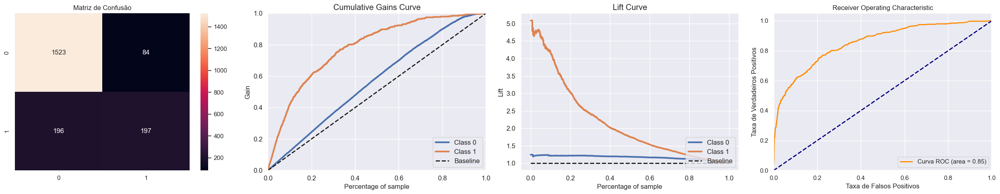

In [82]:
# Nomes das classes
class_names = [str(i) for i in range(len(set(y_test)))]

# Criando a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Criando a figura com 5 subplots (1 a mais para a análise da matriz de confusão)
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Selecionando o primeiro subplot e plotando a matriz de confusão
ax1 = ax[0]
sns.heatmap(cm,  annot=True,  fmt='d', ax=ax1)
ax1.set_title('Matriz de Confusão')


# Cumulative Gains
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=ax[1])


# Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=ax[2])


# ROC AUC

roc_score = roc_auc_score(y_test, y_prob[:,1])
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])


# Plotar a curva ROC

ax[3].plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (area = %0.2f)' % roc_score)
ax[3].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax[3].set_xlim([0.0, 1.0])
ax[3].set_ylim([0.0, 1.05])
ax[3].set_xlabel('Taxa de Falsos Positivos')
ax[3].set_ylabel('Taxa de Verdadeiros Positivos')
ax[3].set_title('Receiver Operating Characteristic')
ax[3].legend(loc="lower right")

# Mostrar os gráficos
plt.tight_layout()
plt.show()

#### 7.1.1 Cross Validation

In [83]:

et_cv = cross_validation('K-NN', model, x_train, x_test, y_train, y_test, 5, top_k=1000)
et_cv

,Model Name,Precision,Recall
0,K-NN,0.364+/-0.01,0.895+/-0.02


In [85]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1607
           1       0.70      0.50      0.58       393

    accuracy                           0.86      2000
   macro avg       0.79      0.72      0.75      2000
weighted avg       0.85      0.86      0.85      2000



### 7.2 Random Forest Classifier

,Model Name,Precision at k,Recall at k
0,Random Forest Classifier,0.3497,0.8906


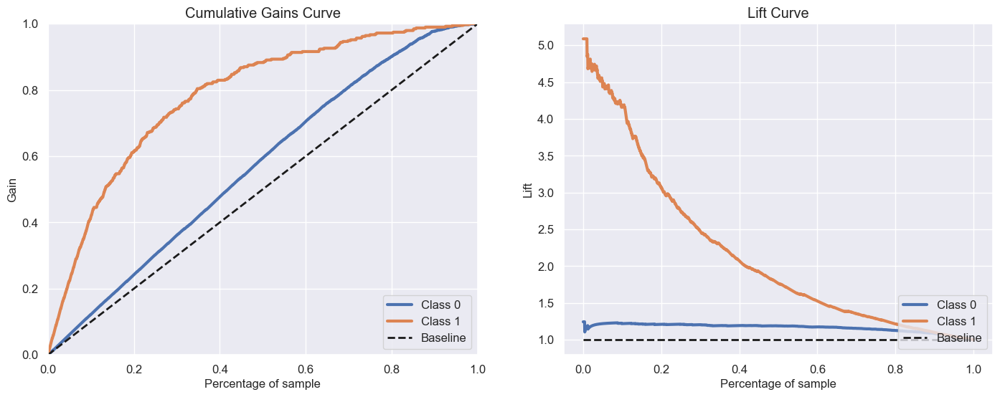

In [121]:
# model
rf = en.RandomForestClassifier(n_estimators= 100,   n_jobs = -1, random_state=42)

model_rf = rf.fit(x_train, y_train)

# predict
y_prob = model_rf.predict_proba(x_test)
y_pred = model_rf.predict(x_test)



rf_result = precision_recall_at_k('Random Forest Classifier', x_test, y_test, y_prob)
display(rf_result)

# plot
fix, axs = plt.subplots(ncols =2 , figsize=(17, 6))
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=axs[0])
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=axs[1]);

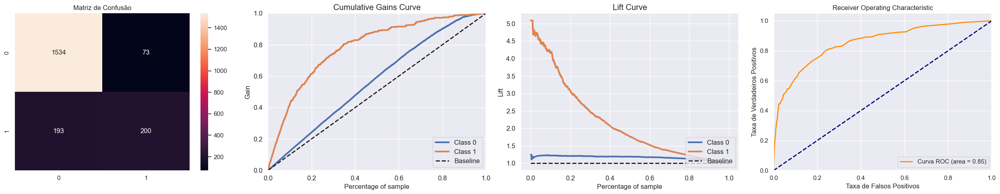

In [109]:
# Criando a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Criando a figura com 5 subplots (1 a mais para a análise da matriz de confusão)
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Selecionando o primeiro subplot e plotando a matriz de confusão
ax1 = ax[0]
sns.heatmap(cm,  annot=True,  fmt='d', ax=ax1)
ax1.set_title('Matriz de Confusão')


# Cumulative Gains
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=ax[1])


# Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=ax[2])


# ROC AUC

roc_score = roc_auc_score(y_test, y_prob[:,1])
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])


# Plotar a curva ROC

ax[3].plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (area = %0.2f)' % roc_score)
ax[3].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax[3].set_xlim([0.0, 1.0])
ax[3].set_ylim([0.0, 1.05])
ax[3].set_xlabel('Taxa de Falsos Positivos')
ax[3].set_ylabel('Taxa de Verdadeiros Positivos')
ax[3].set_title('Receiver Operating Characteristic')
ax[3].legend(loc="lower right")

# Mostrar os gráficos
plt.tight_layout()
plt.show()

#### 7.2.1 Cross Validation

In [187]:

rf_cv = cross_validation('Random Forest Classifier', model_rf, x_train, x_test, y_train, y_test, 5, top_k=1000)
rf_cv

,Model Name,Precision,Recall
0,Random Forest Classifier,0.363+/-0.01,0.892+/-0.02


In [113]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1607
           1       0.73      0.51      0.60       393

    accuracy                           0.87      2000
   macro avg       0.81      0.73      0.76      2000
weighted avg       0.86      0.87      0.86      2000



### 7.3 XGBoost Classifier

,Model Name,Precision at k,Recall at k
0,XGboost Classifier,0.3407,0.8677


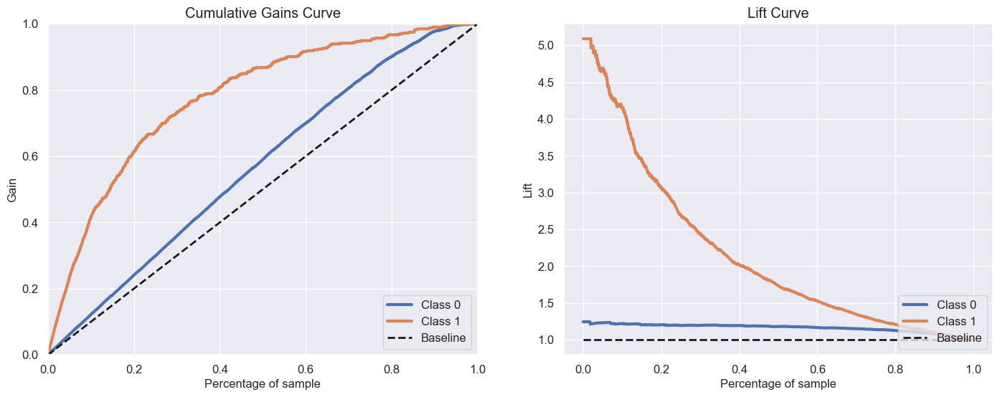

In [181]:
# model
xgb_model = xgb.XGBClassifier(n_estimators=100,
                              random_state=42).fit(x_train, y_train)

# predict
y_prob = xgb_model.predict_proba(x_test)
y_pred = xgb_model.predict(x_test)

xgb_result = precision_recall_at_k('XGboost Classifier', x_test, y_test, y_prob)
display(xgb_result)

# plot
fix, axs = plt.subplots(ncols =2 , figsize=(17, 6))
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=axs[0])
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=axs[1]);

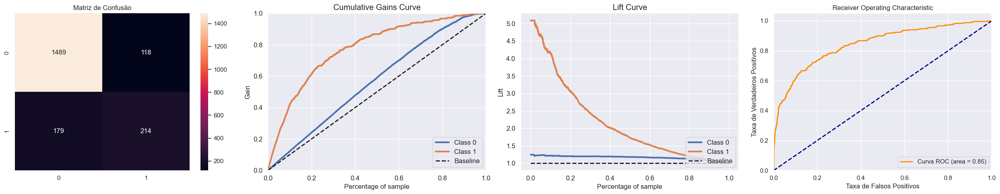

In [182]:
# Criando a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Criando a figura com 5 subplots (1 a mais para a análise da matriz de confusão)
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Selecionando o primeiro subplot e plotando a matriz de confusão
ax1 = ax[0]
sns.heatmap(cm,  annot=True,  fmt='d', ax=ax1)
ax1.set_title('Matriz de Confusão')


# Cumulative Gains
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=ax[1])


# Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=ax[2])


# ROC AUC

roc_score = roc_auc_score(y_test, y_prob[:,1])
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])


# Plotar a curva ROC

ax[3].plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (area = %0.2f)' % roc_score)
ax[3].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax[3].set_xlim([0.0, 1.0])
ax[3].set_ylim([0.0, 1.05])
ax[3].set_xlabel('Taxa de Falsos Positivos')
ax[3].set_ylabel('Taxa de Verdadeiros Positivos')
ax[3].set_title('Receiver Operating Characteristic')
ax[3].legend(loc="lower right")

# Mostrar os gráficos
plt.tight_layout()
plt.show()

#### 7.3.1 Cross Validation

In [188]:
xgb_cv = cross_validation('XGBoost', xgb_model, x_train, x_test, y_train, y_test, 5, top_k=1000)
xgb_cv

,Model Name,Precision,Recall
0,XGBoost,0.359+/-0.01,0.882+/-0.01


In [184]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91      1607
           1       0.64      0.54      0.59       393

    accuracy                           0.85      2000
   macro avg       0.77      0.74      0.75      2000
weighted avg       0.84      0.85      0.85      2000



### 7.4 Light Gradient Boost Machine Classifier

[LightGBM] [Info] Number of positive: 1644, number of negative: 5944
[LightGBM] [Info] Total Bins 855
[LightGBM] [Info] Number of data points in the train set: 7588, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


,Model Name,Precision at k,Recall at k
0,LGBM Classifier,0.3556,0.9059


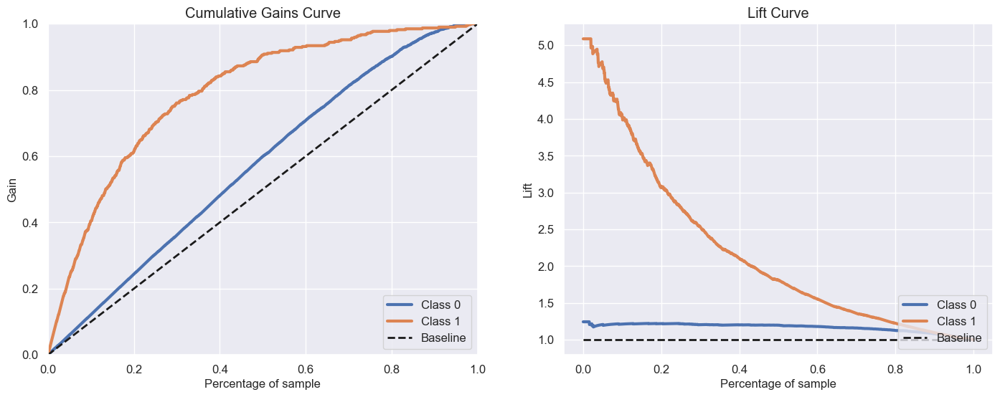

In [139]:
lgbm_model = LGBMClassifier( n_estimators=100, random_state=42, n_jobs = -1, class_weight='balanced', force_row_wise=True).fit(x_train, y_train)

y_prob = lgbm_model.predict_proba(x_test)
y_pred = lgbm_model.predict(x_test)

lgbm_result = precision_recall_at_k('LGBM Classifier', x_test, y_test, y_prob)
display(lgbm_result)

fix, axs = plt.subplots(ncols =2 , figsize=(17, 6))
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=axs[0])
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=axs[1]);

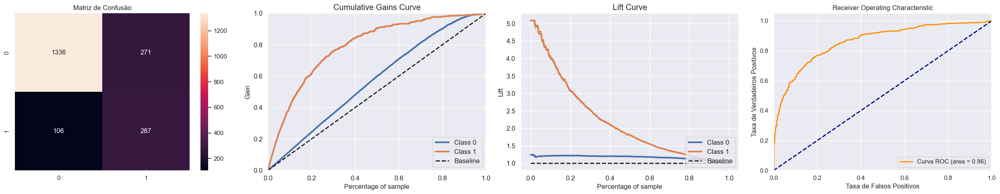

In [137]:
# Criando a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Criando a figura com 5 subplots (1 a mais para a análise da matriz de confusão)
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Selecionando o primeiro subplot e plotando a matriz de confusão
ax1 = ax[0]
sns.heatmap(cm,  annot=True,  fmt='d', ax=ax1)
ax1.set_title('Matriz de Confusão')


# Cumulative Gains
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=ax[1])


# Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=ax[2])


# ROC AUC

roc_score = roc_auc_score(y_test, y_prob[:,1])
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])


# Plotar a curva ROC

ax[3].plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (area = %0.2f)' % roc_score)
ax[3].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax[3].set_xlim([0.0, 1.0])
ax[3].set_ylim([0.0, 1.05])
ax[3].set_xlabel('Taxa de Falsos Positivos')
ax[3].set_ylabel('Taxa de Verdadeiros Positivos')
ax[3].set_title('Receiver Operating Characteristic')
ax[3].legend(loc="lower right")

# Mostrar os gráficos
plt.tight_layout()
plt.show()

#### 7.4.1 Cross Validation

In [189]:

lgbm_cv = cross_validation('Light GBM', lgbm_model, x_train, x_test, y_train, y_test, 5, top_k=1000)
lgbm_cv

[LightGBM] [Info] Number of positive: 1630, number of negative: 6040
[LightGBM] [Info] Total Bins 855
[LightGBM] [Info] Number of data points in the train set: 7670, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Number of positive: 1629, number of negative: 6041
[LightGBM] [Info] Total Bins 855
[LightGBM] [Info] Number of data points in the train set: 7670, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Number of positive: 1629, number of negative: 6041
[LightGBM] [Info] Total Bins 856
[LightGBM] [Info] Number of data points in the train set: 7670, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Numb

,Model Name,Precision,Recall
0,Light GBM,0.364+/-0.01,0.893+/-0.01


              precision    recall  f1-score   support

           0       0.93      0.83      0.88      1607
           1       0.51      0.73      0.60       393

    accuracy                           0.81      2000
   macro avg       0.72      0.78      0.74      2000
weighted avg       0.85      0.81      0.82      2000



### 7.5 SVM - Support Vector Machine

In [142]:
from sklearn import svm

,Model Name,Precision at k,Recall at k
0,SVM Classifier,0.3287,0.8372


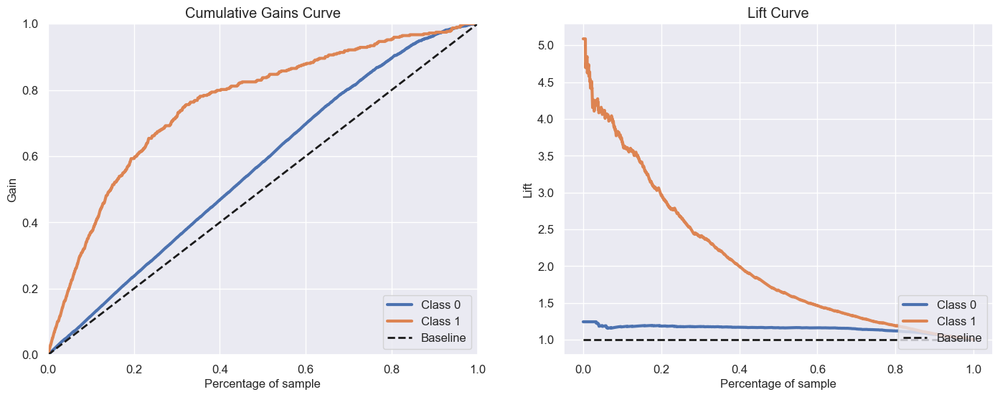

In [157]:
svm_model = svm.SVC(probability=True)
svm_model.fit(x_train, y_train)


y_pred = svm_model.predict(x_test)
y_prob = svm_model.predict_proba(x_test)



svm_result = precision_recall_at_k('SVM Classifier', x_test, y_test, y_prob)
display(svm_result)

fix, axs = plt.subplots(ncols =2 , figsize=(17, 6))
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=axs[0])
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=axs[1]);

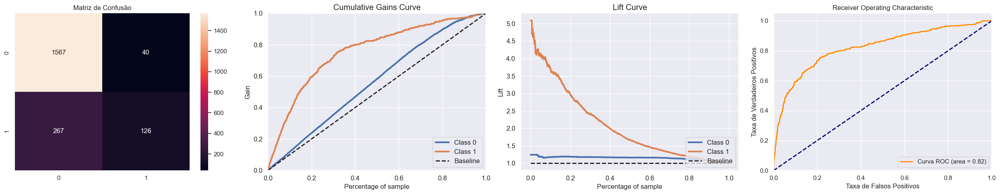

In [158]:
# Criando a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Criando a figura com 5 subplots (1 a mais para a análise da matriz de confusão)
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Selecionando o primeiro subplot e plotando a matriz de confusão
ax1 = ax[0]
sns.heatmap(cm,  annot=True,  fmt='d', ax=ax1)
ax1.set_title('Matriz de Confusão')


# Cumulative Gains
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=ax[1])


# Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=ax[2])


# ROC AUC

roc_score = roc_auc_score(y_test, y_prob[:,1])
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])


# Plotar a curva ROC

ax[3].plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (area = %0.2f)' % roc_score)
ax[3].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax[3].set_xlim([0.0, 1.0])
ax[3].set_ylim([0.0, 1.05])
ax[3].set_xlabel('Taxa de Falsos Positivos')
ax[3].set_ylabel('Taxa de Verdadeiros Positivos')
ax[3].set_title('Receiver Operating Characteristic')
ax[3].legend(loc="lower right")

# Mostrar os gráficos
plt.tight_layout()
plt.show()

#### 7.5.1 Cross Validation

In [190]:

svm_cv = cross_validation('SVC', svm_model, x_train, x_test, y_train, y_test, 5, top_k=1000)
svm_cv

,Model Name,Precision,Recall
0,SVC,0.345+/-0.01,0.848+/-0.01


In [159]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91      1607
           1       0.76      0.32      0.45       393

    accuracy                           0.85      2000
   macro avg       0.81      0.65      0.68      2000
weighted avg       0.84      0.85      0.82      2000



### 7.6 Naive Bayes

,Model Name,Precision at k,Recall at k
0,Naive Bayes Classifier,0.3277,0.8346


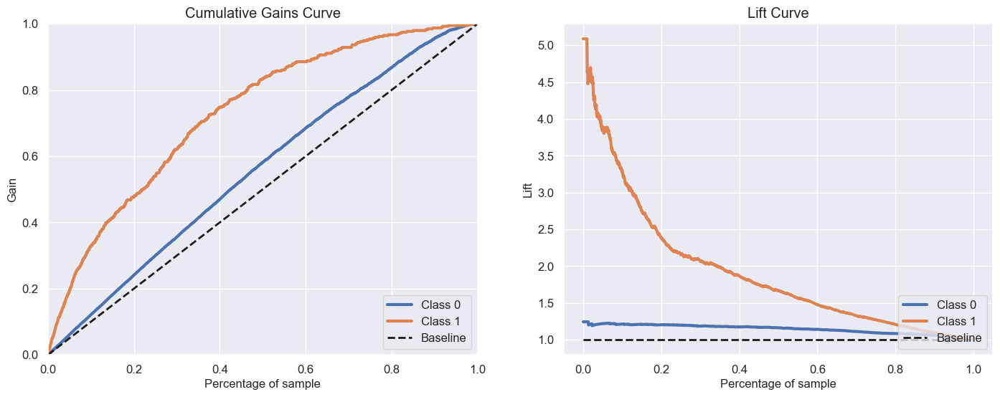

In [175]:
nb_model = GaussianNB() 

nb_model.fit(x_train, y_train)

y_pred = nb_model.predict(x_test)
y_prob = nb_model.predict_proba(x_test)

nb_result = precision_recall_at_k('Naive Bayes Classifier', x_test, y_test, y_prob)
display(nb_result)

fix, axs = plt.subplots(ncols =2 , figsize=(17, 6))
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=axs[0])
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=axs[1]);

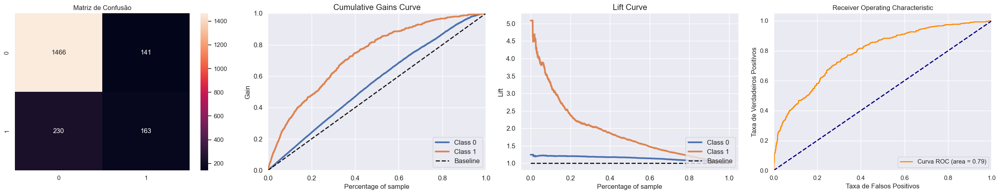

In [176]:
# Criando a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Criando a figura com 5 subplots (1 a mais para a análise da matriz de confusão)
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Selecionando o primeiro subplot e plotando a matriz de confusão
ax1 = ax[0]
sns.heatmap(cm,  annot=True,  fmt='d', ax=ax1)
ax1.set_title('Matriz de Confusão')


# Cumulative Gains
skplt.metrics.plot_cumulative_gain(y_test, y_prob, ax=ax[1])


# Lift Curve
skplt.metrics.plot_lift_curve(y_test, y_prob, ax=ax[2])


# ROC AUC

roc_score = roc_auc_score(y_test, y_prob[:,1])
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])


# Plotar a curva ROC

ax[3].plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (area = %0.2f)' % roc_score)
ax[3].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax[3].set_xlim([0.0, 1.0])
ax[3].set_ylim([0.0, 1.05])
ax[3].set_xlabel('Taxa de Falsos Positivos')
ax[3].set_ylabel('Taxa de Verdadeiros Positivos')
ax[3].set_title('Receiver Operating Characteristic')
ax[3].legend(loc="lower right")

# Mostrar os gráficos
plt.tight_layout()
plt.show()

#### 7.6.1 Cross Validation

In [191]:

nb_cv = cross_validation('Naive Bayes', nb_model, x_train, x_test, y_train, y_test, 5, top_k=1000)
nb_cv

,Model Name,Precision,Recall
0,Naive Bayes,0.339+/-0.0,0.834+/-0.01


### 7.7 Compare Model's Performance

In [194]:
single_performance = pd.concat( [et_result, rf_result, xgb_result, lgbm_result, svm_result, nb_result] )
single_performance.sort_values('Recall at k', ascending= False)

,Model Name,Precision at k,Recall at k
0,LGBM Classifier,0.3556,0.9059
0,Random Forest Classifier,0.3497,0.8906
0,ExtraTreesClassifier,0.3457,0.8804
0,XGboost Classifier,0.3407,0.8677
0,SVM Classifier,0.3287,0.8372
0,Naive Bayes Classifier,0.3277,0.8346


In [177]:
df_aux = x_test.copy()
df_aux['response'] = y_test.values
df_aux['score'] = y_prob[:,1].tolist()
df_aux['predicted'] = y_prob_test

#Sort by propensity score
df_aux = df_aux.sort_values(by='score', ascending=False).reset_index(drop=True) 




In [178]:
df_aux_full, df_aux_atk =ranking_score(x_test, y_test, y_prob)
df_aux_atk

,k,precision_at_k,recall_at_k,score
0,0.05,0.760000,0.193384,0.773306
1,0.10,0.650000,0.330789,0.627642
2,0.15,0.543333,0.414758,0.502374
3,0.20,0.470000,0.478372,0.408736
4,0.25,0.424000,0.539440,0.334841
5,0.30,0.406667,0.620865,0.268162
6,0.35,0.390000,0.694656,0.217180
7,0.40,0.367500,0.748092,0.181459
8,0.45,0.344444,0.788804,0.150177
9,0.50,0.328000,0.834606,0.125583


In [166]:
df_aux_full.sort_values(by='score', ascending=False).head(500)

,CreditScore,Age,Balance,Tenure,HasCrCard,IsActiveMember,NumOfProducts,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,response,pred,score
0,0.107434,1.833333,0.455773,0.2,1,0,0.000000,0.039871,0,1,0,1,1,0.999998
1,-0.058610,1.666667,0.225913,0.6,1,0,0.000000,0.069147,0,1,0,1,1,0.999994
2,1.103696,2.000000,0.789263,0.8,1,0,0.000000,0.911014,0,1,0,1,1,0.996970
3,-0.888828,2.333333,0.704456,0.4,1,0,0.000000,0.537686,0,1,0,1,1,0.996966
4,-0.411452,2.083333,1.035001,0.8,1,0,0.000000,0.967316,0,1,0,1,1,0.996908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.948030,0.166667,-1.218471,0.8,1,0,0.000000,0.471148,1,0,0,0,0,0.185703
496,-1.065249,1.083333,0.298551,0.9,0,1,0.333333,0.067631,1,0,0,0,0,0.185291
497,-1.303937,1.250000,0.280005,0.8,0,1,0.000000,0.105756,1,0,0,1,0,0.184761
498,-0.857695,0.000000,1.643587,0.9,1,0,0.000000,0.999792,1,0,0,0,0,0.184596


## 8.0. HIPERPARAMETER FINE-TUNNING

In [196]:
param = {
    'boosting_type': ['gbdt', 'dart'],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [20, 40, 60, 80],
    'n_estimators': [500, 1000, 2000, 3000],
    'max_depth': [3, 5, 10],
    'min_child_samples': [20, 40, 100],
    'subsample': [0.1, 0.3, 0.7, 0.9],
    'colsample_bytree': [0.6, 0.7, 0.8],
    'reg_alpha': [1, 3, 5, 7],
    'reg_lambda':[1, 3, 5, 7],
    'random_state': [42],
    'class_weight':['balanced']
}

MAX_EVAL = 5 

In [199]:
final_result = pd.DataFrame()

for i in range(MAX_EVAL):
    hp = {k: random.sample(v,1)[0] for k, v in param.items()}
    print(hp)
    
    lgbm_model_tunned = LGBMClassifier( 
                                   boosting_type=hp['boosting_type'],
                                   learning_rate=hp['learning_rate'],
                                   colsample_bytree=hp['colsample_bytree'],
                                   subsample=hp['subsample'],
                                   max_depth=hp['max_depth'],
                                   reg_alpha=hp['reg_alpha'],
                                   reg_lambda=hp['reg_lambda'],
                                   num_leaves=hp['num_leaves'],
                                   random_state=hp['random_state'],
                                   min_child_samples=hp['min_child_samples'],
                                   n_estimators=hp['n_estimators'],
                                   class_weight=hp['class_weight']).fit(x_train, y_train)
    
    #performance
    result = cross_validation('LGBM Classifier', lgbm_model_tunned, x_train, x_test, y_train, y_test, 5, 2)
    final_result = pd.concat([final_result, result])

{'boosting_type': 'dart', 'learning_rate': 0.05, 'num_leaves': 80, 'n_estimators': 500, 'max_depth': 10, 'min_child_samples': 40, 'subsample': 0.1, 'colsample_bytree': 0.8, 'reg_alpha': 5, 'reg_lambda': 5, 'random_state': 42, 'class_weight': 'balanced'}
[LightGBM] [Info] Number of positive: 1644, number of negative: 5944
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 855
[LightGBM] [Info] Number of data points in the train set: 7588, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

In [200]:
final_result

,Model Name,Precision,Recall
0,LGBM Classifier,1.0+/-0.0,0.007+/-0.0
0,LGBM Classifier,1.0+/-0.0,0.007+/-0.0
0,LGBM Classifier,1.0+/-0.0,0.007+/-0.0
0,LGBM Classifier,1.0+/-0.0,0.007+/-0.0
0,LGBM Classifier,1.0+/-0.0,0.007+/-0.0


## 9.0. FINAL MODEL

## 10.0. DEPLOY